In [162]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/m5-forecasting-accuracy/calendar.csv
/kaggle/input/m5-forecasting-accuracy/sample_submission.csv
/kaggle/input/m5-forecasting-accuracy/sell_prices.csv
/kaggle/input/m5-forecasting-accuracy/sales_train_validation.csv
/kaggle/input/m5-forecasting-accuracy/sales_train_evaluation.csv


In [163]:
sales=pd.read_csv('/kaggle/input/m5-forecasting-accuracy/sales_train_evaluation.csv')
calendar=pd.read_csv('/kaggle/input/m5-forecasting-accuracy/calendar.csv',dayfirst=True,keep_date_col=True)
sales_price=pd.read_csv('/kaggle/input/m5-forecasting-accuracy/sell_prices.csv')

In [164]:
calendar.head(2)


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0


In [165]:
sales_price.head(2)

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58


In [166]:
sales.head(2)

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0


In [167]:
sales['item_id'].unique

<bound method Series.unique of 0        HOBBIES_1_001
1        HOBBIES_1_002
2        HOBBIES_1_003
3        HOBBIES_1_004
4        HOBBIES_1_005
             ...      
30485      FOODS_3_823
30486      FOODS_3_824
30487      FOODS_3_825
30488      FOODS_3_826
30489      FOODS_3_827
Name: item_id, Length: 30490, dtype: object>

### The Data consist of 3 main files:
**1)** "*Calendar*" has all the details related to the **events** and **SNAP** availability for stores at every dates.

**2)** "*Sales_Evaluation*", has all the item level sales in units for **1941 days** starting from **"2011-01-29" to "2016-06-19"**. It has the sales data for **30489** products for every state, shop, category.

**3)**  The "*Sales_Price*" contains all the **sales price of each unit**, throughout the weeks for which we have the sales data.


### *Plotting the Time Series for 3 years overall & then going down into details*

In [168]:
sales_data=sales[sales.columns[6:]].transpose()
training_dates=pd.to_datetime(calendar['date'])[:sales_data.shape[0]]
sales_data.index=training_dates
training_dates

0      2011-01-29
1      2011-01-30
2      2011-01-31
3      2011-02-01
4      2011-02-02
          ...    
1936   2016-05-18
1937   2016-05-19
1938   2016-05-20
1939   2016-05-21
1940   2016-05-22
Name: date, Length: 1941, dtype: datetime64[ns]

In [169]:
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import time

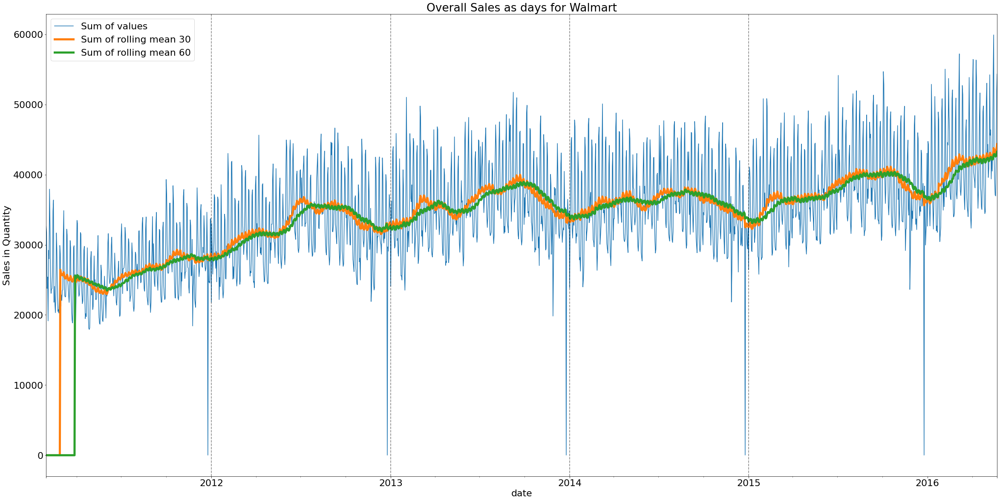

In [170]:
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
plt.title('Overall Sales as days for Walmart')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')
sales_data.sum(axis=1).plot(figsize=(40,20))
sales_data.rolling(30).mean().sum(axis=1).plot(figsize=(40,20),linewidth=5)
sales_data.rolling(60).mean().sum(axis=1).plot(figsize=(40,20),linewidth=5)
plt.legend(['Sum of values','Sum of rolling mean 30','Sum of rolling mean 60'])
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

* **Good news** for **Walmart** is that the overall sales is **increasing** as years are increasing, because we can clearly see the plot going up.
* Also, there is clearly a seasonal trend, as the sales seems to follow a same pattern yearly.

#### Features to consider:
* Using **rolling mean values at various windows** will be useful feature, because as the "**Size of the Window**" **increase**, the value keeps on going towards a straight line, but an optimum value can tell us a lot about the trend or the growth of the data. Hence helping in our forecasts.

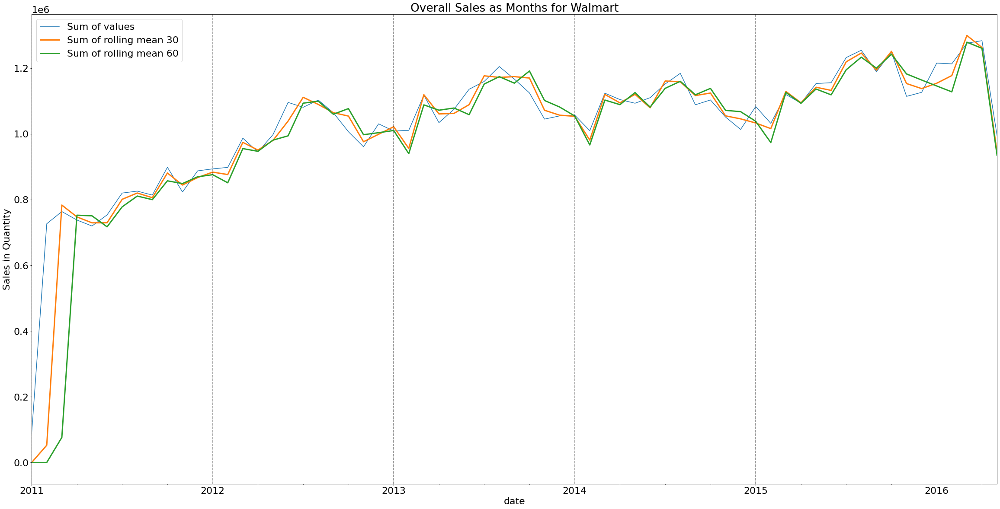

In [171]:
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
plt.title('Overall Sales as Months for Walmart')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')
sales_data.sum(axis=1).resample('M').sum().plot(figsize=(40,20))
sales_data.rolling(30).mean().sum(axis=1).resample('M').sum().plot(figsize=(40,20), linewidth=3)
sales_data.rolling(60).mean().sum(axis=1).resample('M').sum().plot(figsize=(40,20), linewidth=3)

plt.legend(['Sum of values','Sum of rolling mean 30','Sum of rolling mean 60'])

for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

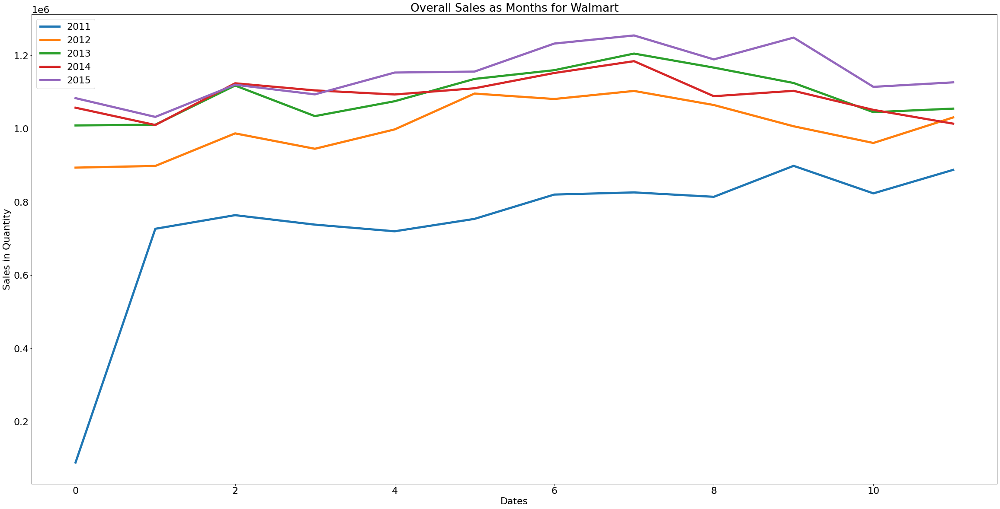

In [172]:
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
plt.figure(figsize=(40,20), linewidth='20') 
plt.title('Overall Sales as Months for Walmart')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')

for year in range(start_date.year,end_date.year):
    p=sales_data.sum(axis=1).resample('M').sum()[pd.to_datetime(str(year)+'-01-01'):pd.to_datetime(str(year+1)+'-01-01')].values
    plt.plot(list(range(len(p))),p, label=year, linewidth=5)

plt.legend()
#for year in range(start_date.year,end_date.year):
    #plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

* The growing trend of sales is clearly visible on the aggregated monthly view.

* We only have quarter yearly data for 2016 and hence currently it seems to show a downward trend, but the sales in 2016 is actually performing well, because the monthly sales for the months in 2016 are better than 2015.

### *Now plotting graphs for various categories like States, Stores, Category etc.*

### 1) *Plotting time series plots for States.*

In [173]:
state_sales=sales.groupby('state_id').sum().transpose()
state_sales.index=training_dates
state_sales

state_id,CA,TX,WI
date,,,
2011-01-29,14195,9438,8998
2011-01-30,13805,9630,8314
2011-01-31,10108,6778,6897
2011-02-01,11047,7381,6984
2011-02-02,9925,5912,3309
...,...,...,...
2016-05-18,15678,10375,11043
2016-05-19,16297,9162,11504
2016-05-20,17430,12303,12819


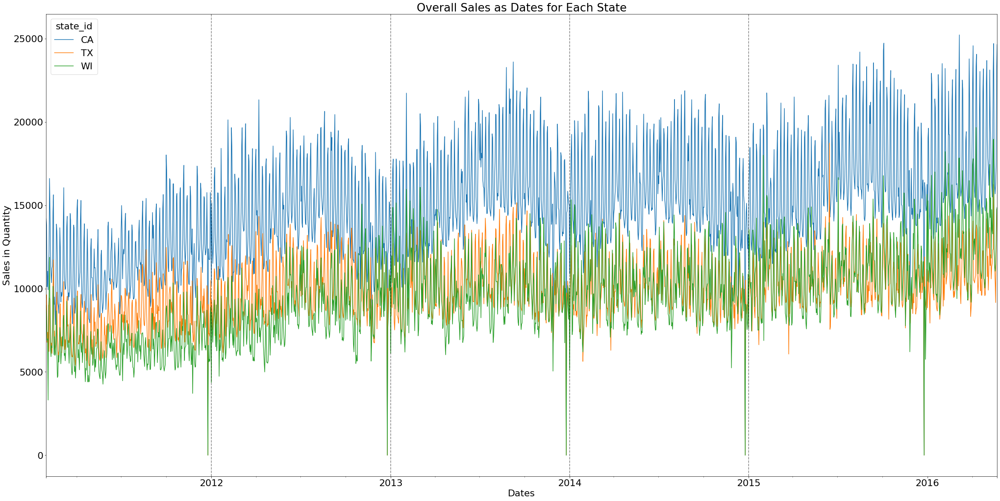

In [174]:
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
state_sales.plot(figsize=(40,20))

plt.title('Overall Sales as Dates for Each State')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

### Inferences:
* The stores in CA, sell more than any other state.
* The sales in TX was more than WI till mid 2012, but after that the sales of "WI" have started growing and are the state with second highest sales from 2013.
* The sales is highly jagged line, showing that the sales at most of the days is "0", so we need to come up with a way or feature to handle this detail.

#### Features to consider:
* So having a categorical feature of the state, would be helpful in our model. As there is clear huge difference in sales for 3 different states.
* Because we see a seasonal trend, lets split the previous years data into blocks and calculate the slope of the trend, and use them as features.
* Lets also use the last 30,60,90 days sales quantity as features.
* Number of days within the last 30 days with 0 sales or below average sales.

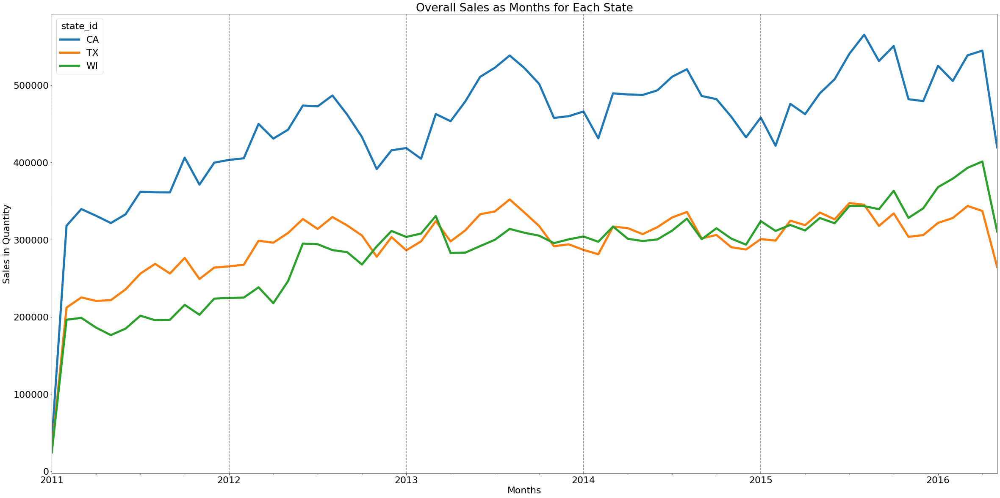

In [175]:
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
state_sales.resample('M').sum().plot(figsize=(40,20),linewidth=5)

plt.title('Overall Sales as Months for Each State')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

* The same trend that "WI" has started performing well in sales as compared to "TX".

#### Features to consider:
* As we can see the seasonality in the sales for all the states, maybe adding features like climate/season, including temperature on that day etc, to consider that feature as well. Because customers may avoid going to shopping when there is heavy snow or rain going on.

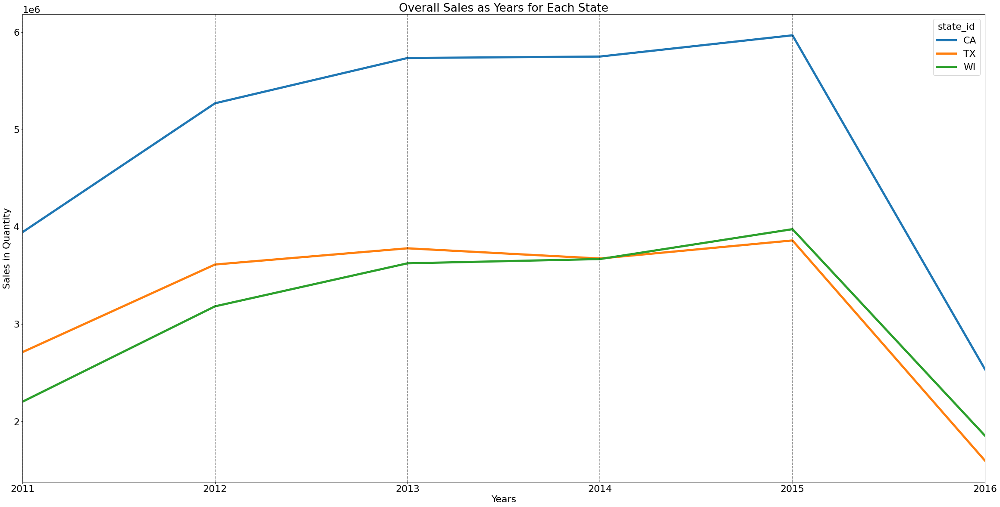

In [176]:
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
state_sales.resample('Y').sum().plot(figsize=(40,20),linewidth=5)

plt.title('Overall Sales as Years for Each State')
plt.xlabel('Years')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

### 2) *Plotting the same plots for Stores*

In [177]:
store_sales=sales.groupby('store_id').sum().transpose()
store_sales.index=training_dates
store_sales

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
date,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132
...,...,...,...,...,...,...,...,...,...,...
2016-05-18,3995,3789,5375,2519,3147,3518,3710,3242,4533,3268
2016-05-19,4136,4037,5580,2544,2748,3126,3288,3478,4628,3398
2016-05-20,4433,4751,5542,2704,3664,4249,4390,3813,4880,4126


***Plotting for each state separately***

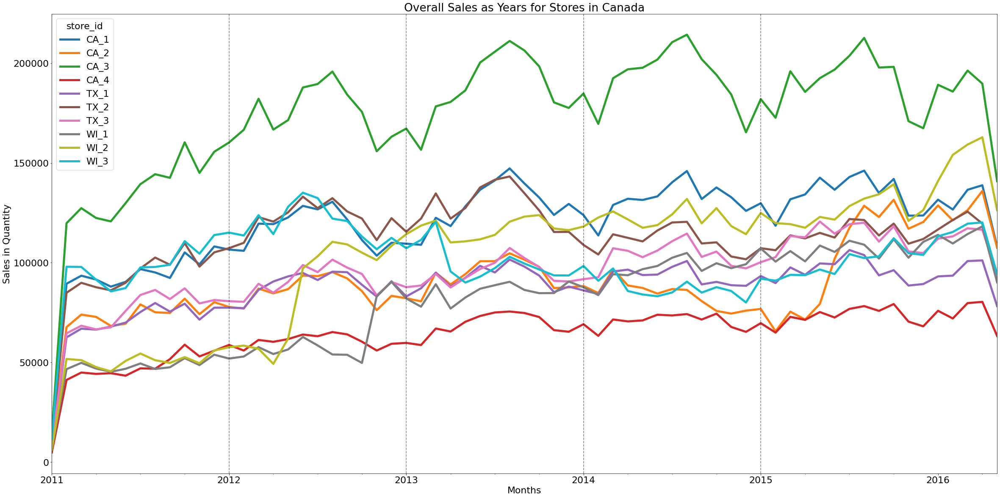

In [178]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales.resample('M').sum().plot(figsize=(40,20),linewidth=5)

plt.title('Overall Sales as Years for Stores in Canada')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

* The CA_3 is the best store with maximum sales & CA_4 is the store with the lowest sales

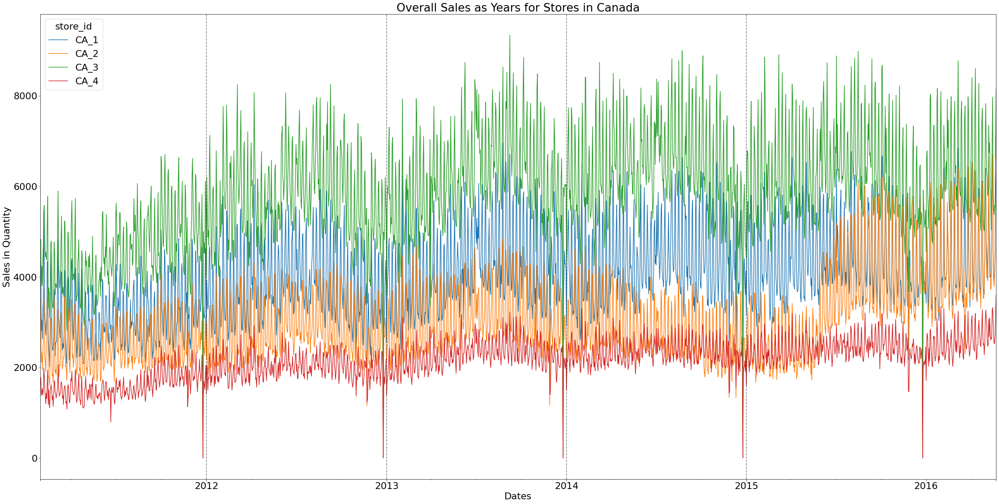

In [179]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales[['CA_1','CA_2','CA_3','CA_4']].plot(figsize=(40,20))

plt.title('Overall Sales as Years for Stores in Canada')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

### *The data is overlapping and hence zooming out to months.*

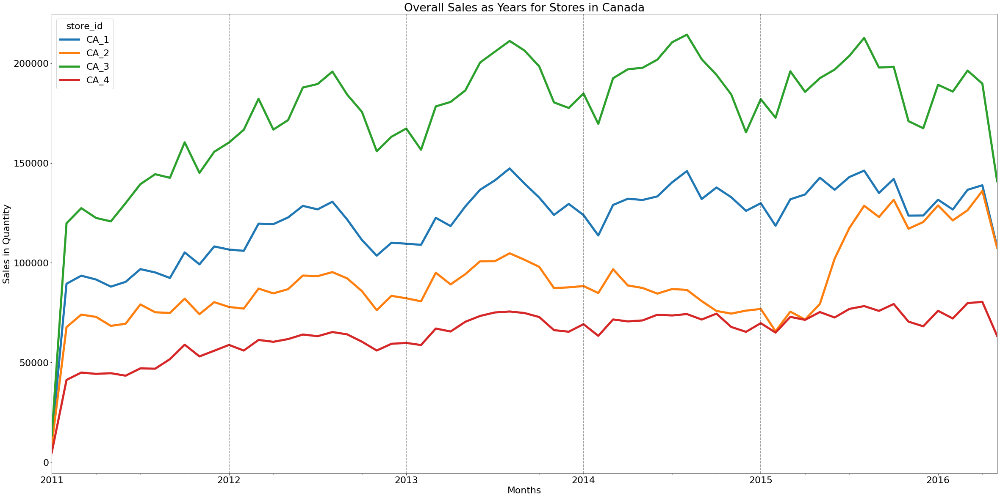

In [180]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales[['CA_1','CA_2','CA_3','CA_4']].resample('M').sum().plot(figsize=(40,20),linewidth=5)

plt.title('Overall Sales as Years for Stores in Canada')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

#### *The sales can be ranked as:*
**1. CA_3**

**2. CA_1**

**3. CA_2**

**4. CA_4**

- **The sales for CA_2 is increasing gradually and it may surpass CA_1 and become the second in terms of sales quantity.**

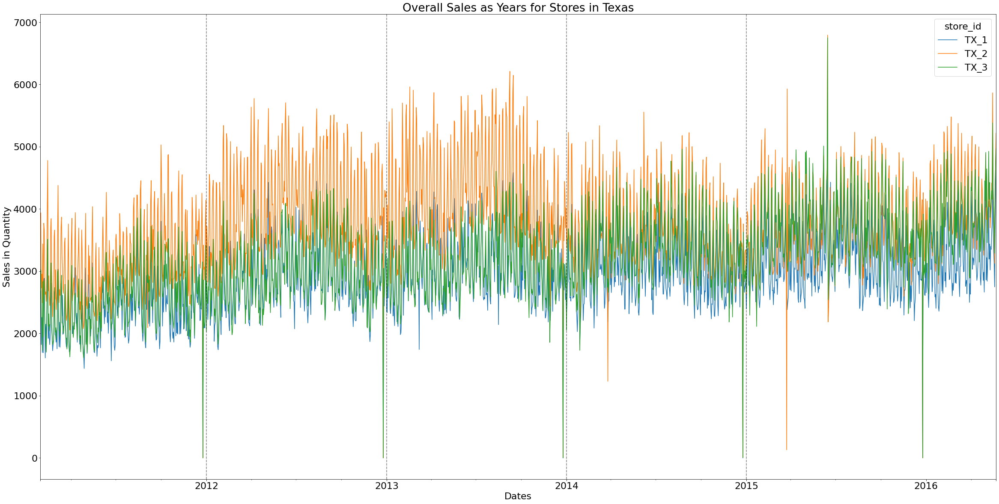

In [181]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales[['TX_1','TX_2','TX_3']].plot(figsize=(40,20))

plt.title('Overall Sales as Years for Stores in Texas')
plt.xlabel('Dates')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

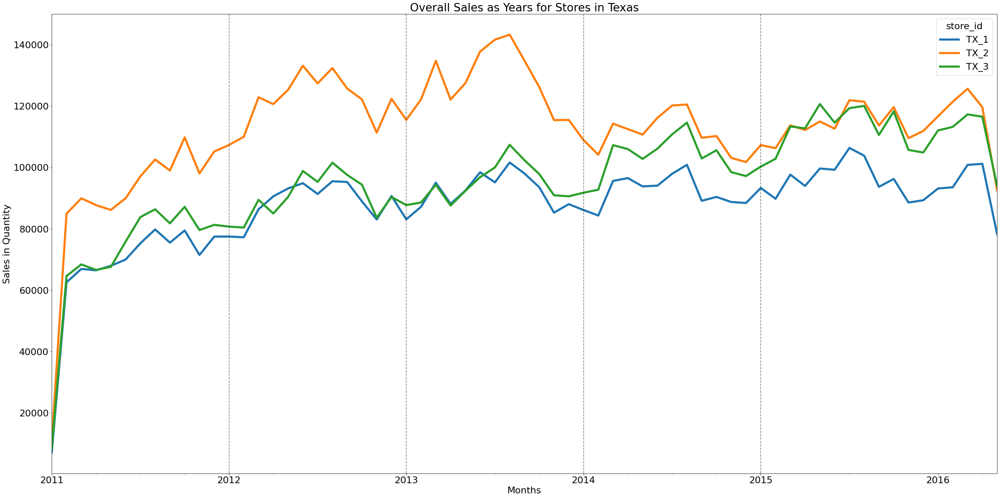

In [182]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales[['TX_1','TX_2','TX_3']].resample('M').sum().plot(figsize=(40,20), linewidth=5)

plt.title('Overall Sales as Years for Stores in Texas')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

#### *The sales can be ranked as:*
**1. TX_2**

**2. TX_3**

**3. TX_1**


- **The sales for TX_2 has drastically decreased in the year 2014. The sales from the other 2 stores have not increased enough to compensate for the sales decrease in TX_2, hence it seems something is wrong, with the store and needs to be monitored to make changes.**

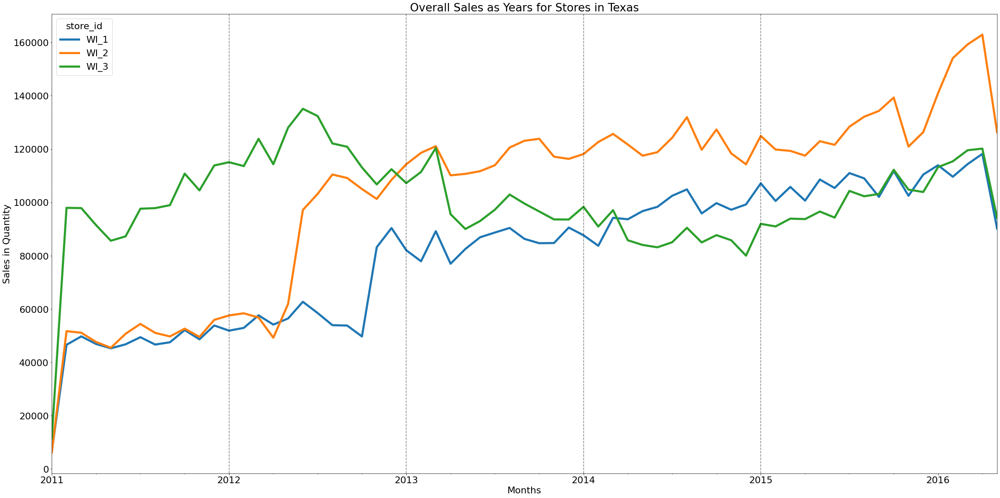

In [183]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
store_sales[['WI_1','WI_2','WI_3']].resample('M').sum().plot(figsize=(40,20), linewidth=5)

plt.title('Overall Sales as Years for Stores in Texas')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

#### *The sales can be ranked as:*
**1. WI_2**

**2. WI_1**

**3. WI_3**


- **The sales for WI_3 has drastically decreased from the year 2013. The WI_1 has grown from the lowest sales to the store with second sales in WI.**

In [184]:
dept_sales=sales.groupby('dept_id').sum().transpose()
dept_sales.index=training_dates
dept_sales

dept_id,FOODS_1,FOODS_2,FOODS_3,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
date,,,,,,,
2011-01-29,2343,4094,16741,3610,154,4105,1584
2011-01-30,2216,4209,16333,3172,185,3858,1776
2011-01-31,1657,3174,12343,2497,185,2827,1100
2011-02-01,1508,3606,13764,2531,138,2732,1133
2011-02-02,1209,2869,10525,1714,100,1802,927
...,...,...,...,...,...,...,...
2016-05-18,3073,4648,17069,3291,449,6641,1925
2016-05-19,3251,4551,16935,3027,448,6759,1992
2016-05-20,3735,4815,19586,3761,382,7974,2299


#### *3. Plotting the time series for Department.*

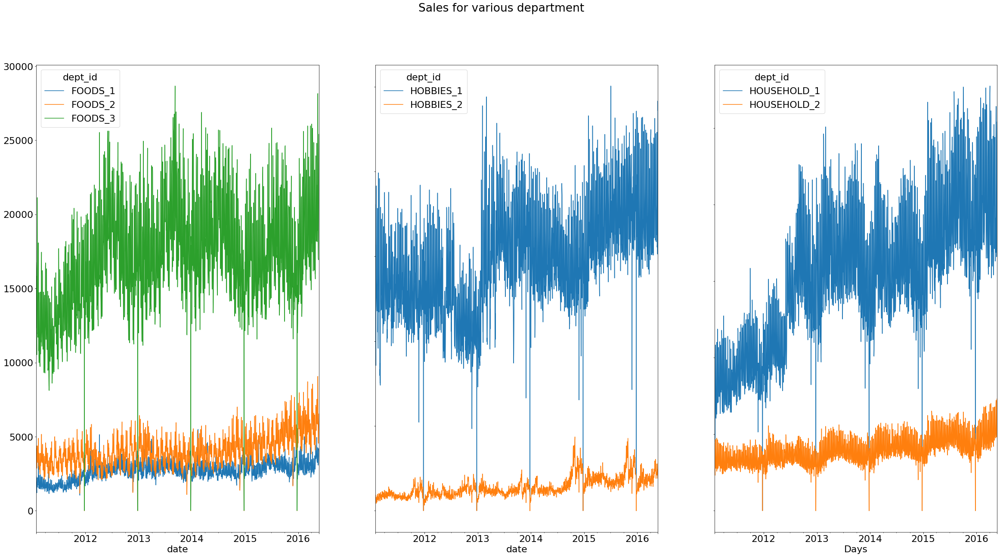

In [185]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,3)
plt.suptitle('Sales for various department')
dept_sales[['FOODS_1','FOODS_2','FOODS_3']].plot(figsize=(40,20), ax=ax[0], sharey=True)
plt.ylabel('Sales in Quantity')
plt.xlabel('Days')

dept_sales[['HOBBIES_1','HOBBIES_2']].plot(figsize=(40,20), ax=ax[1],sharey=True)
plt.xlabel('Days')

dept_sales[['HOUSEHOLD_1','HOUSEHOLD_2']].plot(figsize=(40,20), ax=ax[2],sharey=True)
plt.xlabel('Days')
plt.show()

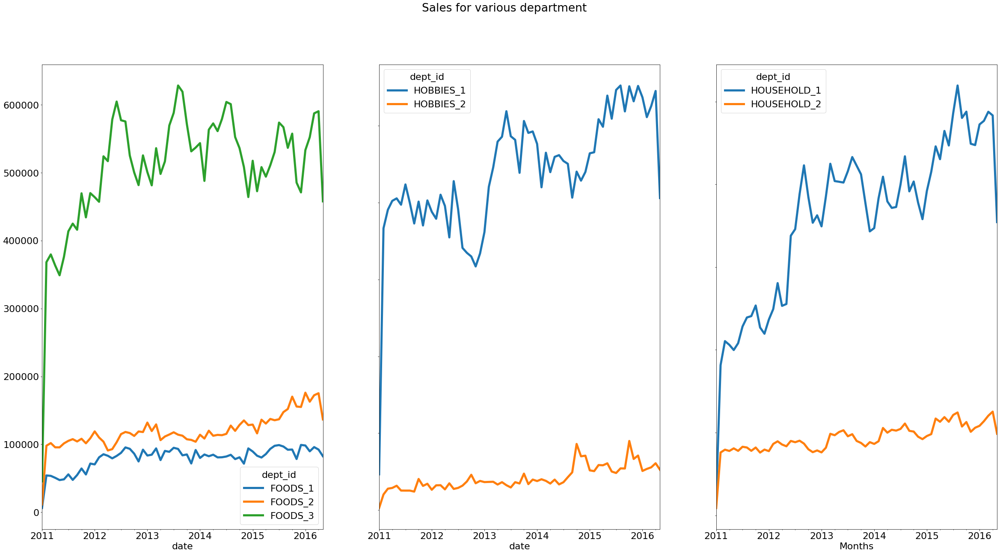

In [186]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,3)
plt.suptitle('Sales for various department')
dept_sales[['FOODS_1','FOODS_2','FOODS_3']].resample('M').sum().plot(figsize=(40,20), ax=ax[0], sharey=True, linewidth=5)
plt.ylabel('Sales in Quantity')
plt.xlabel('Months')

dept_sales[['HOBBIES_1','HOBBIES_2']].resample('M').sum().plot(figsize=(40,20), ax=ax[1],sharey=True, linewidth=5)
plt.xlabel('Months')

dept_sales[['HOUSEHOLD_1','HOUSEHOLD_2']].resample('M').sum().plot(figsize=(40,20), ax=ax[2],sharey=True, linewidth=5)
plt.xlabel('Months')
plt.show()

#### The Top Performer in each Department are:
**1) FOODS_3**

**2) HOBBIES_1**

**3) HOUSEHOLD_1**

**The sales of these Department are the highest and they have also grown over the years.**

### *4. Plotting the time series for Main Category*

In [187]:
cat_sales=sales.groupby('cat_id').sum().transpose()
cat_sales.index=training_dates

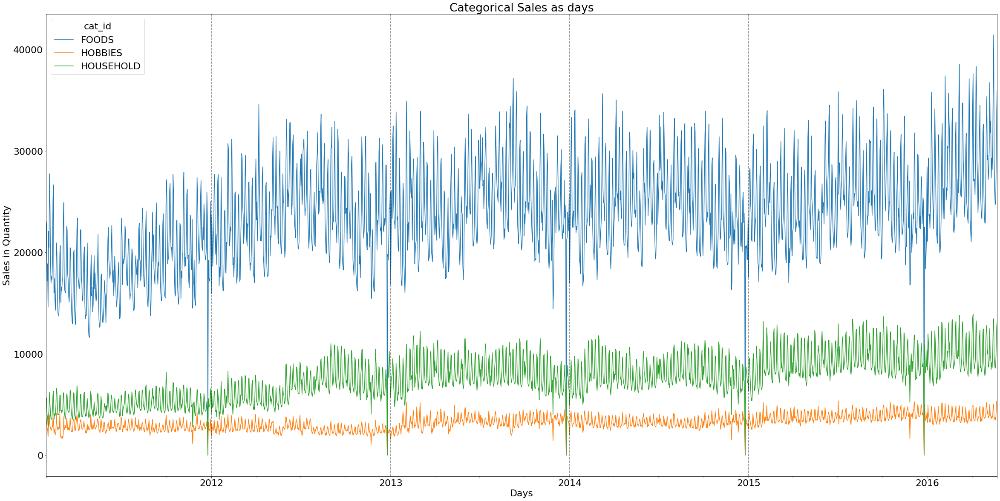

In [188]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
cat_sales.plot(figsize=(40,20))

plt.title('Categorical Sales as days')
plt.xlabel('Days')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

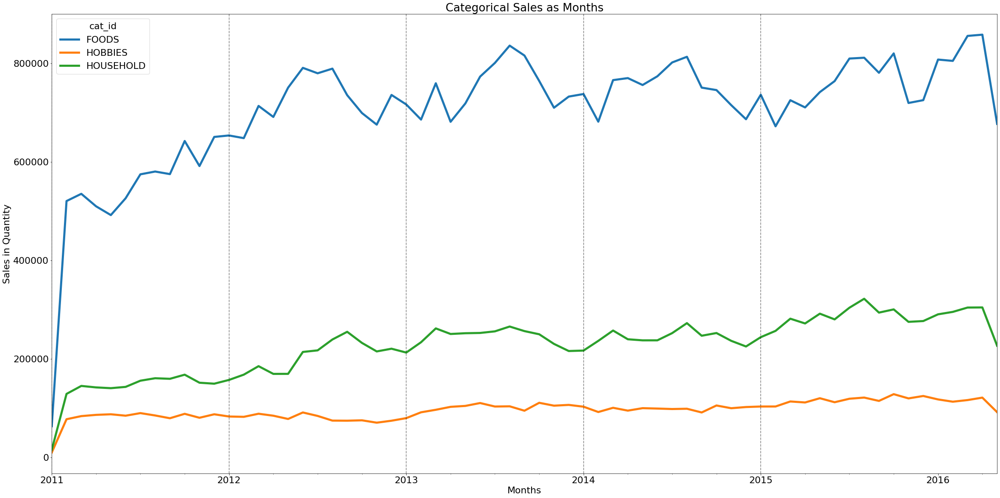

In [189]:
#California
#plotting the same data in a monthly aggregated format
start_date = datetime.datetime(2011,1,1)
end_date = datetime.datetime(2016,1,1)

plt.rcParams.update({'font.size': 22})
cat_sales.resample('M').sum().plot(figsize=(40,20), linewidth=5)

plt.title('Categorical Sales as Months')
plt.xlabel('Months')
plt.ylabel('Sales in Quantity')
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.5)
plt.show()

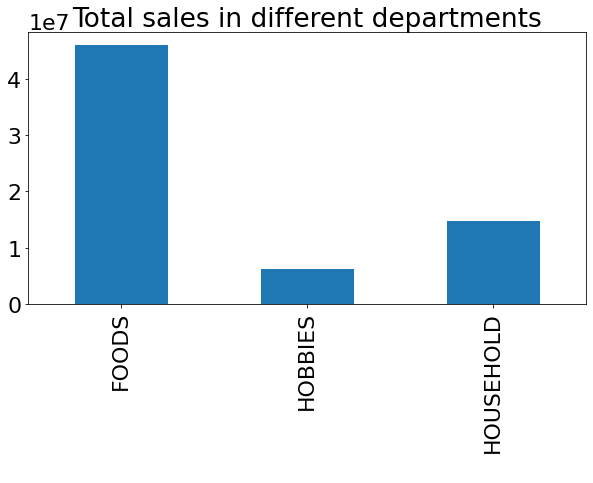

In [190]:
cat_sales.sum(axis=0).plot(kind='bar', figsize=(10,5), title="Total sales in different departments", xlabel=' ')
plt.show()

### *The Category of "FOOD" has the highest number of sales for Walmart altogether.*

In [191]:
c1=calendar

In [192]:
c1['is_event_day']=calendar[calendar['event_name_1'].notnull() | calendar['event_name_2'].notnull()]['date']

In [193]:
calendar[calendar['event_name_1'].notnull() | calendar['event_name_2'].notnull()]['date']

8       2011-02-06
16      2011-02-14
23      2011-02-21
39      2011-03-09
46      2011-03-16
           ...    
1926    2016-05-08
1948    2016-05-30
1951    2016-06-02
1956    2016-06-07
1968    2016-06-19
Name: date, Length: 162, dtype: object

In [194]:
c1['is_event_day']=np.where(c1['is_event_day'].notnull(),c1['is_event_day'],0)

In [195]:
c1['is_event_day']=np.where(c1['is_event_day']==0,c1['is_event_day'],1)

In [196]:
c1['is_event_day']

0       0
1       0
2       0
3       0
4       0
       ..
1964    0
1965    0
1966    0
1967    0
1968    1
Name: is_event_day, Length: 1969, dtype: object

In [197]:
c1['is_event_day'].unique()

array([0, 1], dtype=object)

In [198]:
!pip install calplot

In [199]:
d=c1['is_event_day'][:len(training_dates)]

In [200]:
d.index=training_dates
d

date
2011-01-29    0
2011-01-30    0
2011-01-31    0
2011-02-01    0
2011-02-02    0
             ..
2016-05-18    0
2016-05-19    0
2016-05-20    0
2016-05-21    0
2016-05-22    0
Name: is_event_day, Length: 1941, dtype: object

In [201]:
sales_data.sum(axis=1)

date
2011-01-29    32631
2011-01-30    31749
2011-01-31    23783
2011-02-01    25412
2011-02-02    19146
              ...  
2016-05-18    37096
2016-05-19    36963
2016-05-20    42552
2016-05-21    51518
2016-05-22    54338
Length: 1941, dtype: int64

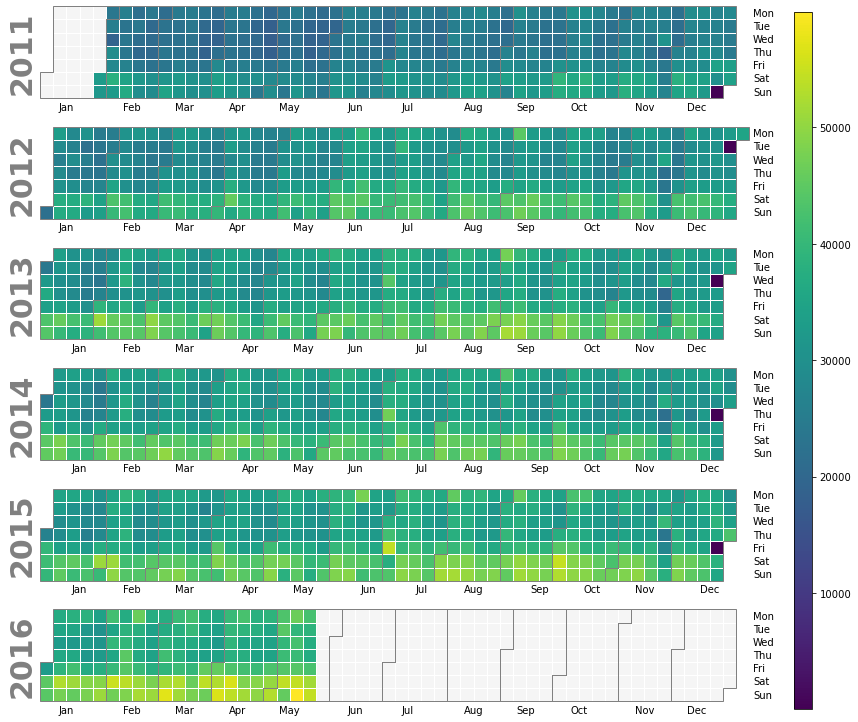

In [202]:
import calplot
plt.rcParams.update({'font.size': 10})

fig, ax=calplot.calplot(sales_data.sum(axis=1))
plt.show()

In [203]:
sales_data['month']=sales_data.index.month

In [204]:
sales_data['dates']=sales_data.index.day

### *We can see from the above plot, that the week day seems to have a pattern, where weekends have high sales, so adding the weekday, as a feature would help in forecasting.*

In [205]:
grouped_date=sales_data.groupby(['dates', 'month']).sum().sum(axis=1)
grouped_date=grouped_date.reset_index()
grouped_date.columns=['dates','month','values']

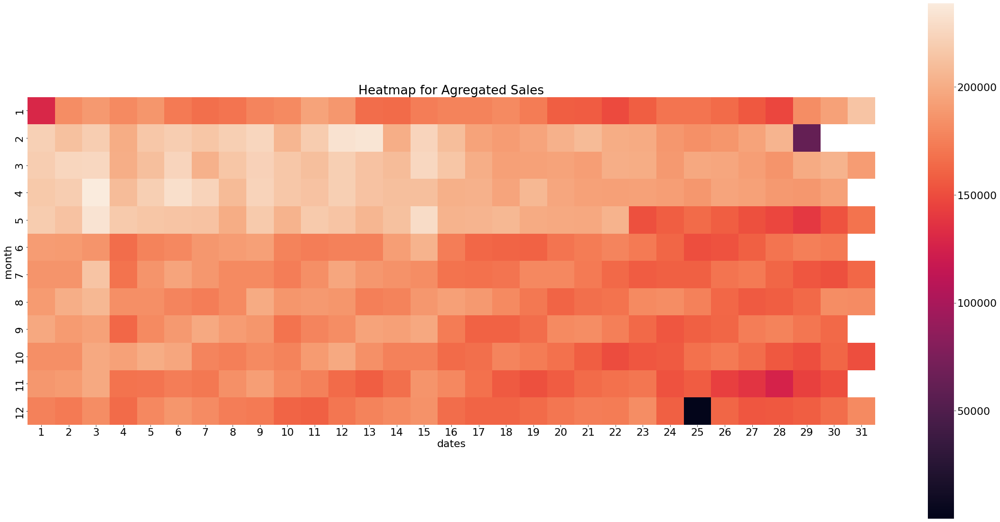

In [206]:
plt.rcParams.update({'font.size': 22})

plt.figure(figsize=(40,20))
plt.title('Heatmap for Agregated Sales')
sns.heatmap(pd.pivot_table(data=grouped_date,values='values',index='month',columns='dates'),square=True, )
plt.show()

*We can clearly see here a trend, that the sales are high in the first 15 days and after that the sales normalizes.*

**Checking if the same trend exists for yearly data**

In [207]:
event_dates=pd.to_datetime(calendar[:len(sales_data)][calendar['event_name_1'].notnull() | calendar['event_name_2'].notnull()]['date'])

In [208]:
def ho(x):
    i=pd.to_datetime(x,errors='coerce',dayfirst=True).dayofweek
    if type(i)==int:
        if i==6:
            j='Sun'
        else:
            j=' '
    else:
        j=' '
    return j

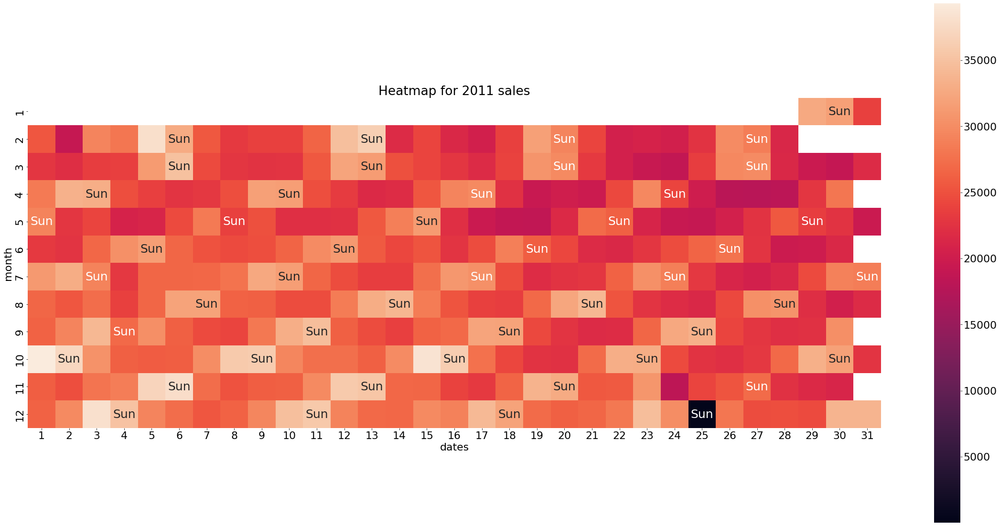

In [209]:
grouped_data_2=sales_data[pd.to_datetime(str(2011)+'-01-01'):pd.to_datetime(str(2011)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2011'


g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')

plt.rcParams.update({'font.size': 22})

plt.figure(figsize=(40,20))
plt.title('Heatmap for 2011 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,annot=d, fmt='s',annot_kws={'size': 25} )
plt.show()

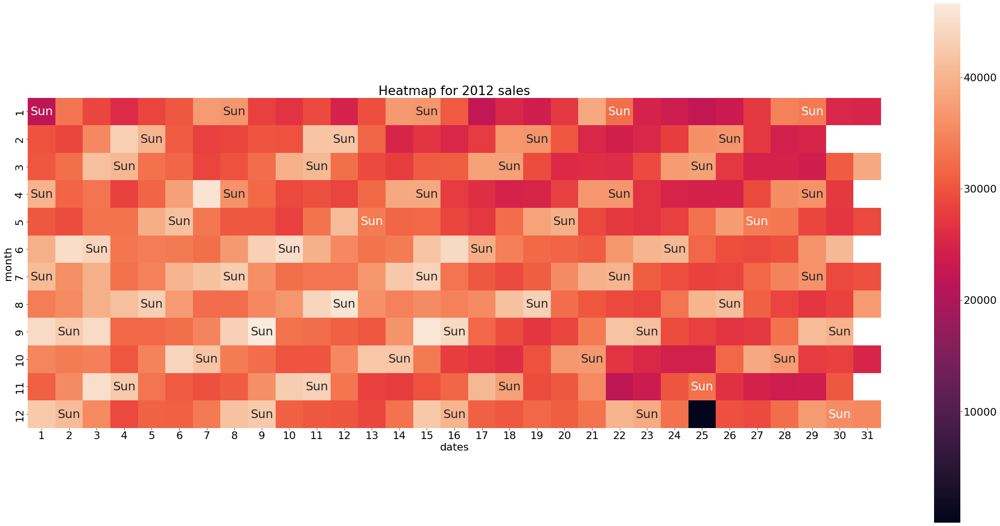

In [210]:
grouped_data_2=sales_data[pd.to_datetime(str(2012)+'-01-01'):pd.to_datetime(str(2012)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

plt.rcParams.update({'font.size': 22})

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2012'

g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')

plt.figure(figsize=(40,20))
plt.title('Heatmap for 2012 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True, fmt='s',annot_kws={'size': 25},annot=d )
plt.show()

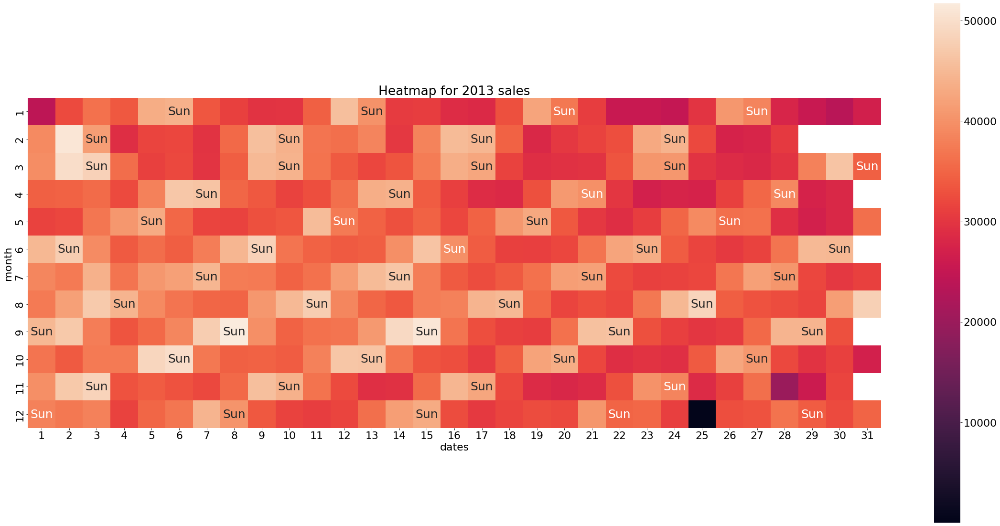

In [211]:
grouped_data_2=sales_data[pd.to_datetime(str(2013)+'-01-01'):pd.to_datetime(str(2013)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

plt.rcParams.update({'font.size': 22})

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2013'

g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')


plt.figure(figsize=(40,20))
plt.title('Heatmap for 2013 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True, fmt='s',annot_kws={'size': 25},annot=d  )
plt.show()

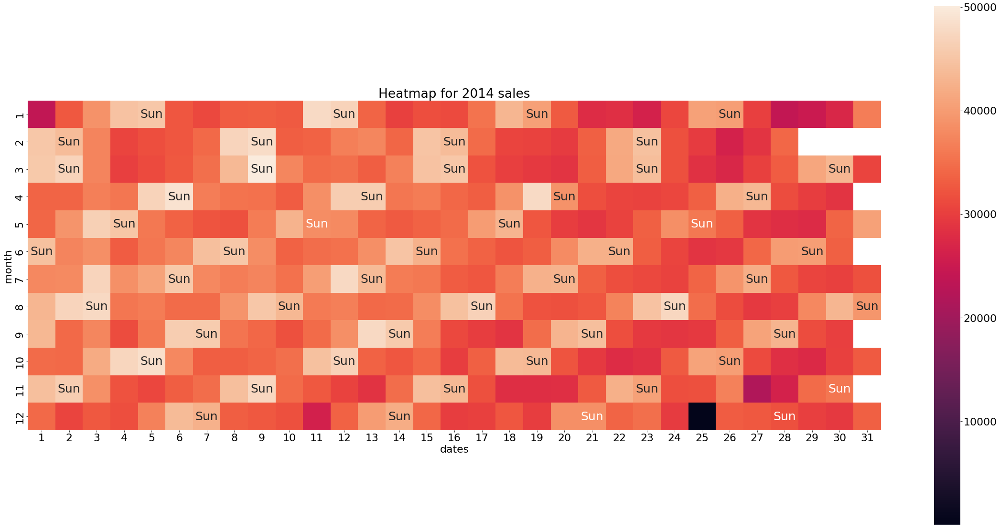

In [212]:
grouped_data_2=sales_data[pd.to_datetime(str(2014)+'-01-01'):pd.to_datetime(str(2014)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

plt.rcParams.update({'font.size': 22})

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2014'

g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')


plt.figure(figsize=(40,20))
plt.title('Heatmap for 2014 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,fmt='s',annot_kws={'size': 25},annot=d  )
plt.show()

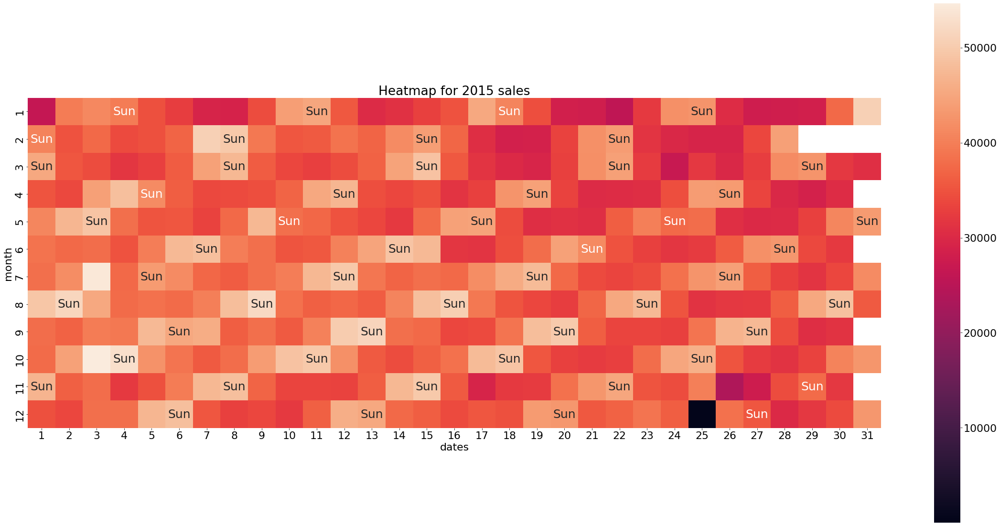

In [213]:
grouped_data_2=sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

plt.rcParams.update({'font.size': 22})

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2015'

g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')

plt.figure(figsize=(40,20))
plt.title('Heatmap for 2015 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,fmt='s',annot_kws={'size': 25},annot=d  )
plt.show()

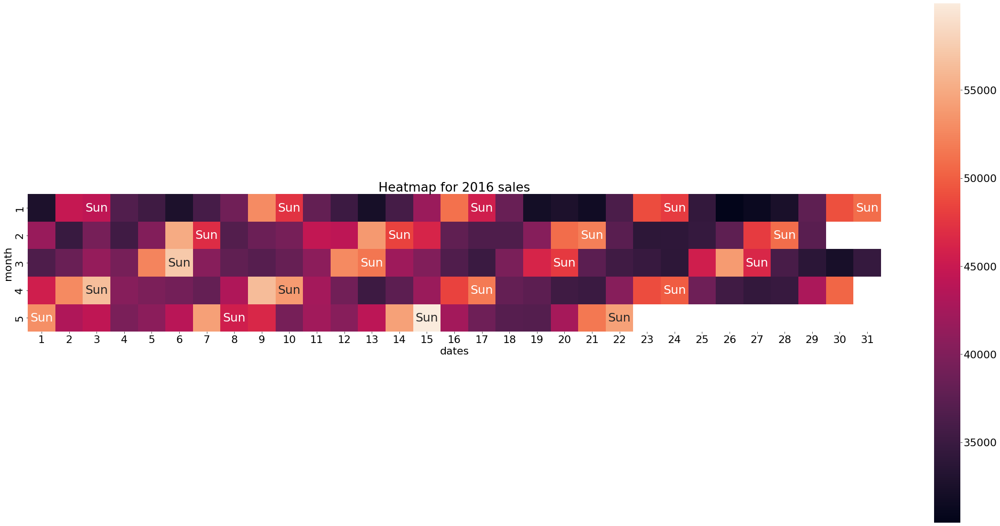

In [214]:
grouped_data_2=sales_data[pd.to_datetime(str(2016)+'-01-01'):pd.to_datetime(str(2016)+'-12-31')].groupby(['dates', 'month']).sum().sum(axis=1)
grouped_data_2=grouped_data_2.reset_index()
grouped_data_2.columns=['dates','month','values']

plt.rcParams.update({'font.size': 22})

g=grouped_data_2.copy()
g['overall_dates']=(g['dates']).astype(str)+'-'+(g['month']).astype(str)+'-2016'

g['is_holiday']=g['overall_dates'].apply(ho)
g.drop(['values','overall_dates'],axis=1, inplace=True)
g.columns=['dates','month','values']

d=pd.pivot(data=g,values='values',index='month',columns='dates').fillna(' ')

plt.figure(figsize=(40,20))
plt.title('Heatmap for 2016 sales')
sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True, fmt='s',annot_kws={'size': 25},annot=d )
plt.show()

The trend which was seen globally is not visible when seen at a year level, hence we can conclude that there is no such trend that the sales is high on the first 15 days.

#### *For Each State which Category has the highest sales?*

In [215]:
state_cat_sales=sales.groupby(['cat_id','state_id']).sum().transpose()
state_cat_sales.index=training_dates
state_cat_sales

cat_id      FOODS              HOBBIES             HOUSEHOLD            
state_id       CA    TX     WI      CA    TX    WI        CA    TX    WI
date                                                                    
2011-01-29  10101  6853   6224    1802   879  1083      2292  1706  1691
2011-01-30   9862  7030   5866    1561   870   926      2382  1730  1522
2011-01-31   6944  5124   5106    1472   526   684      1692  1128  1107
2011-02-01   7864  5470   5544    1405   809   455      1778  1102   985
2011-02-02   7178  4602   2823    1181   501   132      1566   809   354
...           ...   ...    ...     ...   ...   ...       ...   ...   ...
2016-05-18  10465  6596   7729    1606  1056  1078      3607  2723  2236
2016-05-19  10650  6083   8004    1735   830   910      3912  2249  2590
2016-05-20  11354  7965   8817    1975  1132  1036      4101  3206  2966
2016-05-21  14489  8834  10276    2701  1440  1192      5913  3407  3266
2016-05-22  15970  9500  10497    2514  1543  1223      6160  3772  3159

[1941 rows x 9 columns]

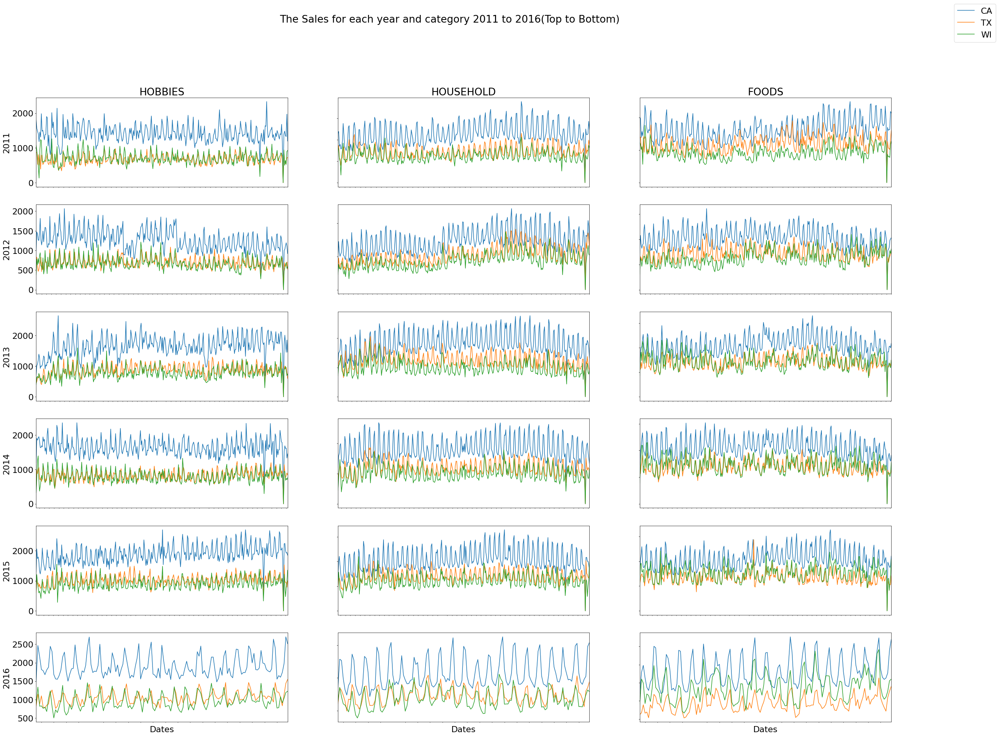

In [216]:
categories=sales['cat_id'].unique()
start_date=pd.to_datetime('1-1-2011')
end_date=pd.to_datetime('31-12-2016')
fig,ax=plt.subplots(6,3,figsize=(50,30))
j=0
plt.suptitle('The Sales for each year and category 2011 to 2016(Top to Bottom)')
for cat in categories:
    for data in range(0,6):
        state_cat_sales[cat][pd.to_datetime(str(start_date.year+data)+'-01-01'):\
                             pd.to_datetime(str(start_date.year+data)+'-12-31')].plot(ax=ax[data,j], figsize=(40,30),sharey=True,legend=None, sharex=True,xticks=[],xlabel='Dates',ylabel=start_date.year+data)
    ax[0][j].set_title(cat) 
    j+=1 
fig.legend(state_cat_sales['FOODS'].columns, loc='upper right')
plt.show()

***In all the categories, the maximum sales throughout the years is in the state of "WI"***

In [217]:
cat_state_sales=sales.groupby(['state_id','cat_id']).sum().transpose()
cat_state_sales.index=training_dates
cat_state_sales

state_id       CA                      TX                       WI          \
cat_id      FOODS HOBBIES HOUSEHOLD FOODS HOBBIES HOUSEHOLD  FOODS HOBBIES   
date                                                                         
2011-01-29  10101    1802      2292  6853     879      1706   6224    1083   
2011-01-30   9862    1561      2382  7030     870      1730   5866     926   
2011-01-31   6944    1472      1692  5124     526      1128   5106     684   
2011-02-01   7864    1405      1778  5470     809      1102   5544     455   
2011-02-02   7178    1181      1566  4602     501       809   2823     132   
...           ...     ...       ...   ...     ...       ...    ...     ...   
2016-05-18  10465    1606      3607  6596    1056      2723   7729    1078   
2016-05-19  10650    1735      3912  6083     830      2249   8004     910   
2016-05-20  11354    1975      4101  7965    1132      3206   8817    1036   
2016-05-21  14489    2701      5913  8834    1440      3407  10276    1192   
2016-05-22  15970    2514      6160  9500    1543      3772  10497    1223   

state_id              
cat_id     HOUSEHOLD  
date                  
2011-01-29      1691  
2011-01-30      1522  
2011-01-31      1107  
2011-02-01       985  
2011-02-02       354  
...              ...  
2016-05-18      2236  
2016-05-19      2590  
2016-05-20      2966  
2016-05-21      3266  
2016-05-22      3159  

[1941 rows x 9 columns]

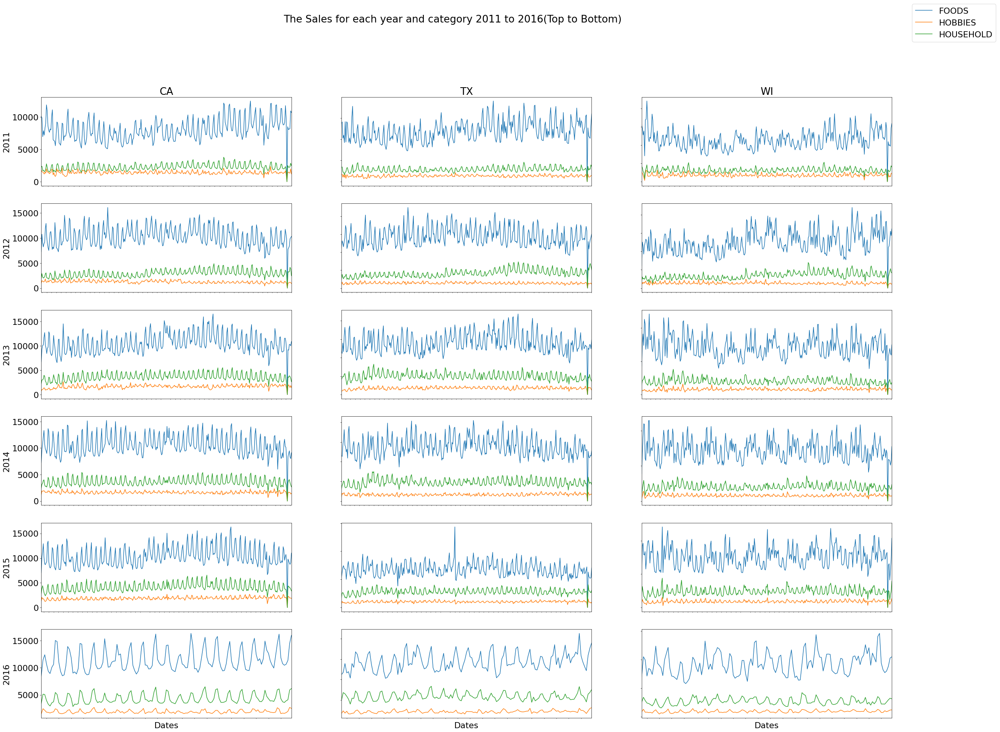

In [218]:
categories=sales['state_id'].unique()
start_date=pd.to_datetime('1-1-2011')
end_date=pd.to_datetime('31-12-2016')
fig,ax=plt.subplots(6,3,figsize=(50,30))
j=0
plt.suptitle('The Sales for each year and category 2011 to 2016(Top to Bottom)')
for cat in categories:
    for data in range(0,6):
        cat_state_sales[cat][pd.to_datetime(str(start_date.year+data)+'-01-01'):\
                             pd.to_datetime(str(start_date.year+data)+'-12-31')].plot(ax=ax[data,j], figsize=(40,30),sharey=True,legend=None, sharex=True,xticks=[],xlabel='Dates',ylabel=start_date.year+data)
    ax[0][j].set_title(cat) 
    j+=1 
fig.legend(cat_state_sales['CA'].columns, loc='upper right')
plt.show()

***In all the years, and among all the states. The maximum number of orders is for the category of "FOOD".***

In [219]:
#dept_id
cat_dep_sales=sales.groupby(['state_id','dept_id']).sum().transpose()
cat_dep_sales.index=training_dates


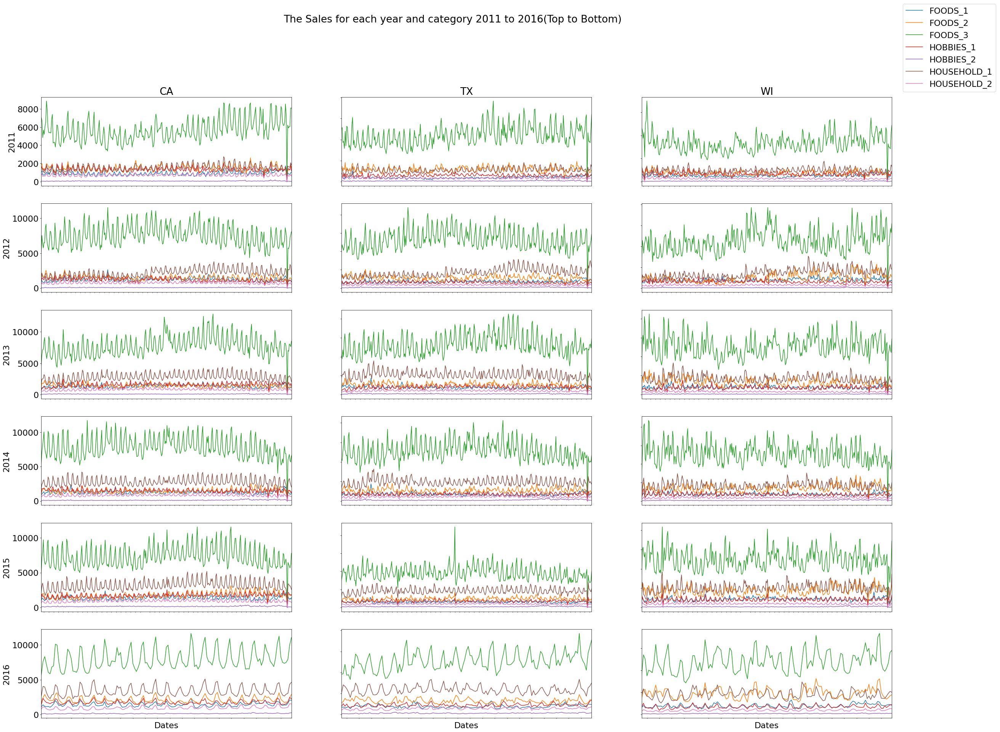

In [220]:
categories=sales['state_id'].unique()
start_date=pd.to_datetime('1-1-2011')
end_date=pd.to_datetime('31-12-2016')
fig,ax=plt.subplots(6,3,figsize=(50,30))
j=0
plt.suptitle('The Sales for each year and category 2011 to 2016(Top to Bottom)')
for cat in categories:
    for data in range(0,6):
        cat_dep_sales[cat][pd.to_datetime(str(start_date.year+data)+'-01-01'):\
                             pd.to_datetime(str(start_date.year+data)+'-12-31')].plot(ax=ax[data,j], figsize=(40,30),sharey=True,legend=None, sharex=True,xticks=[],xlabel='Dates',ylabel=start_date.year+data)
    ax[0][j].set_title(cat) 
    j+=1 
fig.legend(cat_dep_sales['CA'].columns, loc='upper right')
plt.show()

***FOOD_3 category has the highest sales numbers, so we need to be careful, in selecting our features because our mode can be easily biased, as there is a huge difference.***

In [221]:
cat_dep_sales['CA'][cat_dep_sales['CA'].columns[3:]]

dept_id,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
date,,,,
2011-01-29,1739,63,1527,765
2011-01-30,1502,59,1515,867
2011-01-31,1422,50,1116,576
2011-02-01,1352,53,1148,630
2011-02-02,1139,42,935,631
...,...,...,...,...
2016-05-18,1460,146,2663,944
2016-05-19,1545,190,2928,984
2016-05-20,1816,159,3045,1056


#### *No of items in each Department*

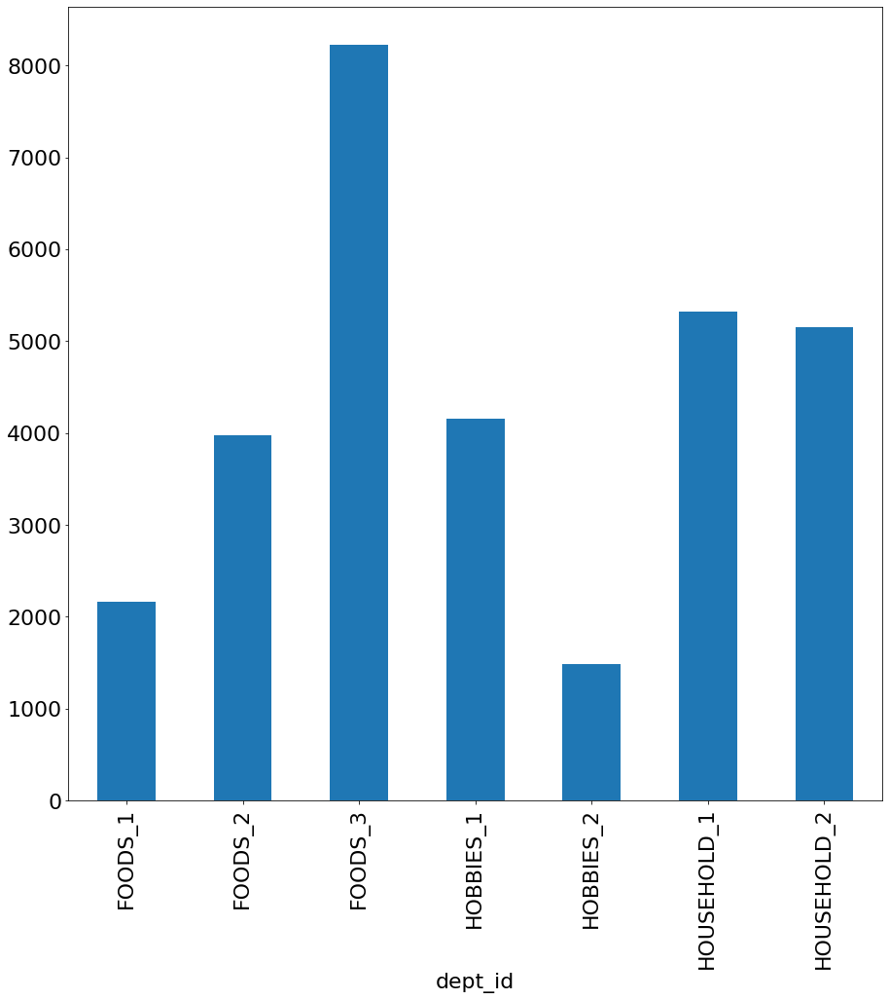

In [222]:
sales.groupby('dept_id')['item_id'].count().plot(kind='bar', figsize=(15,15))
plt.show()

***The FOOD_3 has maximum SKU/item_ids, hence they have high sales quantity when aggregated.***

**Out of all the dates, how many are event days?**

In [223]:
#Unique Events
unique_event_names=set(calendar['event_name_1'].unique()).union(set(calendar['event_name_2'].unique()))
print('The number of unique events our dataset are:',len(unique_event_names)-1)
for e in list(unique_event_names)[1:]:
    print(e)

The number of unique events our dataset are: 30
PresidentsDay
Christmas
Halloween
StPatricksDay
EidAlAdha
NBAFinalsStart
Eid al-Fitr
MartinLutherKingDay
Easter
ColumbusDay
Thanksgiving
VeteransDay
OrthodoxEaster
Cinco De Mayo
MemorialDay
LaborDay
NewYear
Pesach End
LentStart
ValentinesDay
Purim End
Chanukah End
Mother's day
Father's day
Ramadan starts
OrthodoxChristmas
LentWeek2
SuperBowl
IndependenceDay
NBAFinalsEnd


In [224]:
#Unique Events
unique_event_types=set(calendar['event_type_1'].unique()).union(set(calendar['event_type_2'].unique()))

print('The number of unique event types our dataset are:',len(unique_event_types)-1)
for e in list(unique_event_types)[1:]:
    print(e)

The number of unique event types our dataset are: 4
National
Religious
Cultural
Sporting


In [225]:
calendar['date']=pd.to_datetime(calendar['date'])
calendar.index=calendar['date']

c_1=calendar['event_name_1'][pd.to_datetime(str(2012)+'-01-01'):\
                             pd.to_datetime(str(2012)+'-12-31')].unique()
c_2=calendar['event_name_1'][pd.to_datetime(str(2013)+'-01-01'):\
                             pd.to_datetime(str(2013)+'-12-31')].unique()

In [226]:
print(set(c_1)==set(c_2))
print(set(c_1)-set(c_2))

False
{'Cinco De Mayo'}


**Some events occur yearly, whereas some do not, so all the events do not repeat yearly.**

In [227]:
#The overall percentage
p=(len(calendar[calendar['event_name_1'].notnull() | calendar['event_name_2'].notnull()])/len(calendar))*100
print('On an overall considering all the dates {} % dates have events'.format(p))

c=calendar[pd.to_datetime(str(2011)+'-01-01'):pd.to_datetime(str(2011)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2011 have events'.format(p))

c=calendar[pd.to_datetime(str(2012)+'-01-01'):pd.to_datetime(str(2012)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2012 have events'.format(p))

c=calendar[pd.to_datetime(str(2012+1)+'-01-01'):pd.to_datetime(str(2012+1)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2013 have events'.format(p))

c=calendar[pd.to_datetime(str(2012+2)+'-01-01'):pd.to_datetime(str(2012+2)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2014 have events'.format(p))

c=calendar[pd.to_datetime(str(2012+3)+'-01-01'):pd.to_datetime(str(2012+3)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2015 have events'.format(p))

c=calendar[pd.to_datetime(str(2012+4)+'-01-01'):pd.to_datetime(str(2012+4)+'-12-31')]
p=(len(c[c['event_name_1'].notnull() | c['event_name_2'].notnull()])/len(c))*100
print('On an overall considering all the dates {} % dates in 2016 have events'.format(p))
#2016, has high % because, it is not full year data

On an overall considering all the dates 8.227526663280853 % dates have events
On an overall considering all the dates 7.71513353115727 % dates in 2011 have events
On an overall considering all the dates 8.19672131147541 % dates in 2012 have events
On an overall considering all the dates 7.9452054794520555 % dates in 2013 have events
On an overall considering all the dates 7.671232876712329 % dates in 2014 have events
On an overall considering all the dates 8.21917808219178 % dates in 2015 have events
On an overall considering all the dates 11.11111111111111 % dates in 2016 have events


***Considering sales from the Event Days***

In [228]:
event_dates=calendar[:len(sales_data)][calendar['event_name_1'].notnull() | calendar['event_name_2'].notnull()]['date']

In [229]:
sales_data['is_event_day']=0
sales_data['is_event_day'].loc[pd.to_datetime(event_dates)]=1

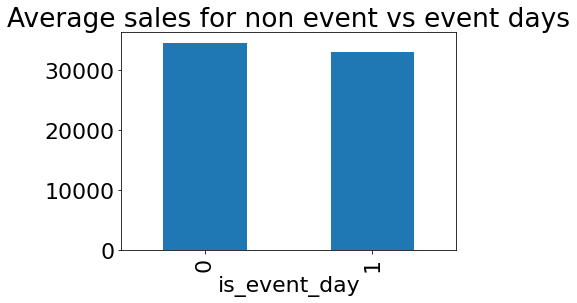

In [230]:
#Overall sales
plt.title('Average sales for non event vs event days')
sales_data.drop(['month','dates'], axis=1).groupby('is_event_day').mean().sum(axis=1).plot(kind='bar')
plt.show()

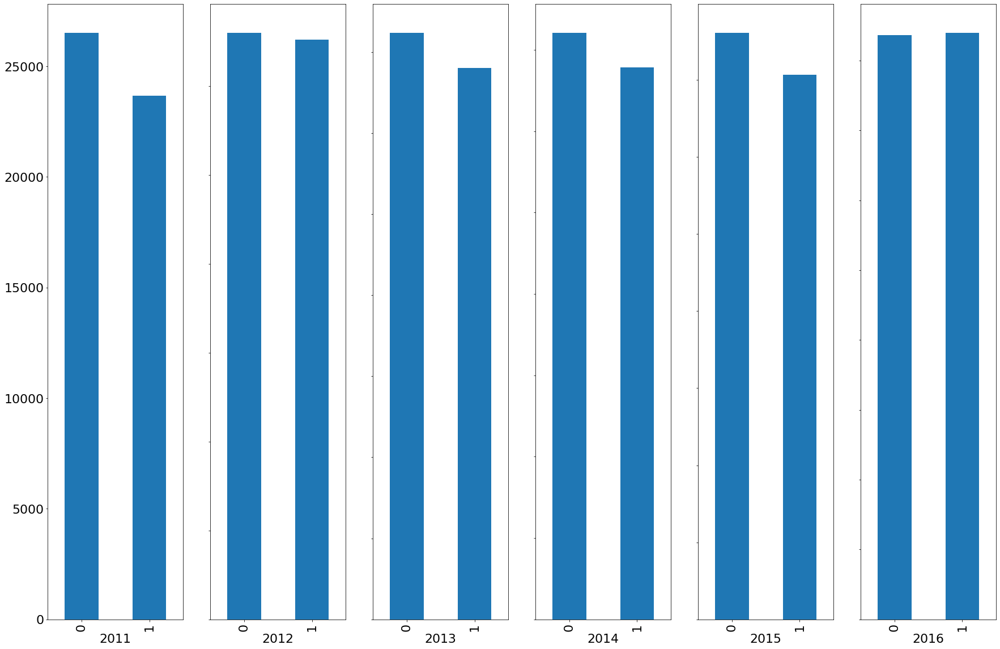

In [231]:
fig, ax=plt.subplots(1,6)
for i in range(6):
    sales_data[pd.to_datetime(str(2011+i)+'-01-01'):\
                             pd.to_datetime(str(2011+i)+'-12-31')].drop(['month','dates'], axis=1).groupby('is_event_day').mean().sum(axis=1).plot(kind='bar', ax=ax[i], figsize=(30,20),xlabel=2011+i, sharey=True)


Comparing with average sales

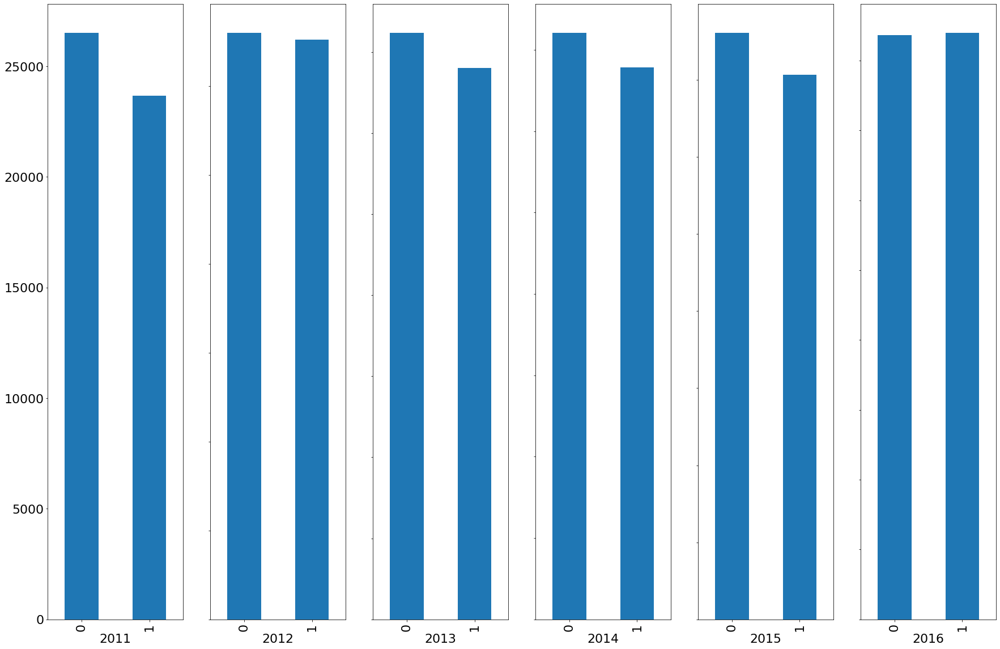

In [232]:
fig, ax=plt.subplots(1,6)
for i in range(6):
    sales_data[pd.to_datetime(str(2011+i)+'-01-01'):\
                             pd.to_datetime(str(2011+i)+'-12-31')].drop(['month','dates'], axis=1).groupby('is_event_day').mean().sum(axis=1).plot(kind='bar', ax=ax[i], figsize=(30,20),xlabel=2011+i,sharey=True)


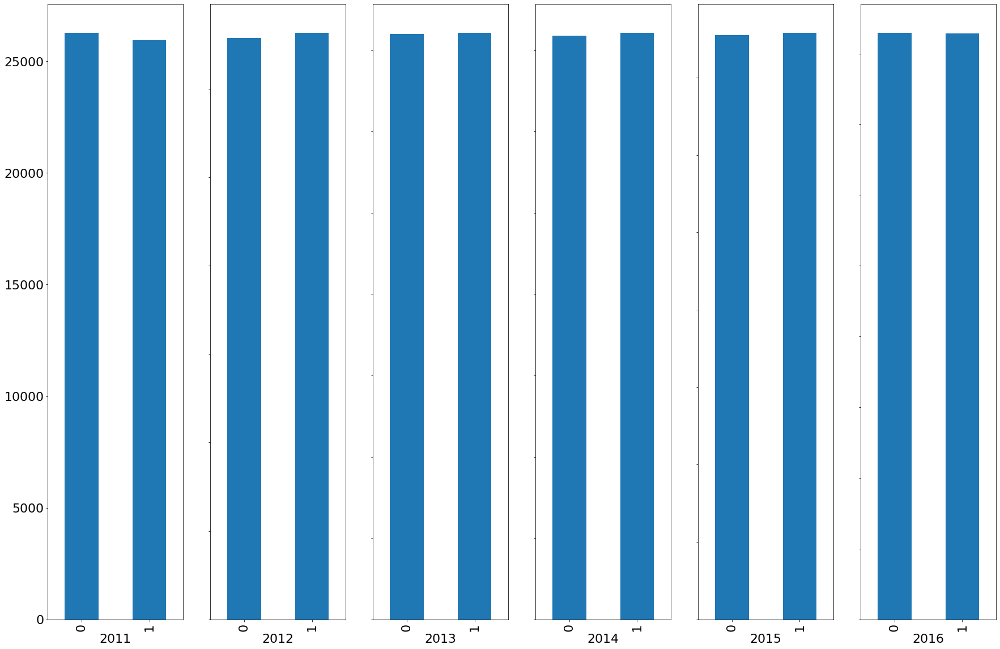

In [233]:
#Checking the rolling average and comparing them
rolling_10=sales_data.drop(['month','dates'],axis=1).rolling(10).mean()
rolling_10['is_event_day']=sales_data['is_event_day']

fig, ax=plt.subplots(1,6)
for i in range(6):
    rolling_10[pd.to_datetime(str(2011+i)+'-01-01'):\
                             pd.to_datetime(str(2011+i)+'-12-31')].groupby('is_event_day').mean().sum(axis=1).plot(kind='bar', ax=ax[i], figsize=(30,20),xlabel=2011+i,sharey=True)



***The average sales on event day is more than the non event days. The sales in a festive season or events starts before the days, hence we have now compared to the rolling averages, and we can see that the sales is higher or equal to the non event day sales.***

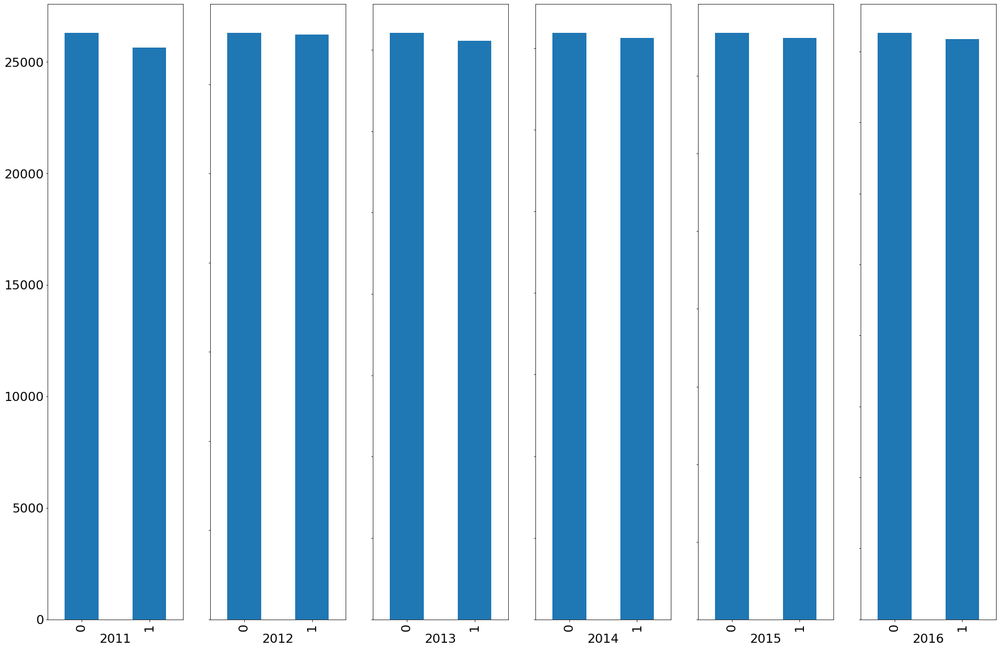

In [234]:
#Checking the rolling average and comparing them
rolling_20=sales_data.drop(['month','dates'],axis=1).rolling(15).mean()
rolling_20['is_event_day']=sales_data['is_event_day']

fig, ax=plt.subplots(1,6)
for i in range(6):
    rolling_20[pd.to_datetime(str(2011+i)+'-01-01'):\
                             pd.to_datetime(str(2011+i)+'-12-31')].groupby('is_event_day').mean().sum(axis=1).plot(kind='bar', ax=ax[i], figsize=(30,20),xlabel=2011+i,sharey=True)



***The rolling average of 10, seems to capture the effect of event on sales because the average sales reduces for values above it.***

### Features to Consider:
* We can have a column "is_event_day" and if yes then give it the sum of last 7 days of sales.

***Checking if the event dates and product category are linked, so that if needed we can add a feature based on them***

In [235]:
calendar[['event_name_1','event_type_1']][calendar['event_name_1'].notnull()]
calendar['event_name_1'][calendar['event_name_1'].notnull()]

calendar['event_type_1'][calendar['event_name_1'].notnull()]
event_vs_type=dict(zip(calendar['event_name_1'][calendar['event_name_1'].notnull()],calendar['event_type_1'][calendar['event_name_1'].notnull()]))
print(len(event_vs_type))
event_vs_type.update(dict(zip(calendar['event_name_2'][calendar['event_name_2'].notnull()],calendar['event_type_2'][calendar['event_name_2'].notnull()])))
print(len(event_vs_type))

30
30


In [236]:
date_vs_event=dict(zip(calendar.loc[event_dates].index,calendar.loc[event_dates]['event_name_1']))

In [237]:
def ho(x):
    i=pd.to_datetime(x,errors='coerce',dayfirst=True)
    if i in event_dates:
        event=date_vs_event.get(i)
        event_type=event_vs_type.get(event)
        j=event_type[:3]
    else:
        j=' '
    return j

In [238]:
cat_sales_data=sales.groupby('cat_id').sum().transpose()
cat_sales_data.index=training_dates
cat_sales_data
categories=cat_sales_data.columns

In [239]:
cat_sales_data

cat_id,FOODS,HOBBIES,HOUSEHOLD
date,,,
2011-01-29,23178,3764,5689
2011-01-30,22758,3357,5634
2011-01-31,17174,2682,3927
2011-02-01,18878,2669,3865
2011-02-02,14603,1814,2729
...,...,...,...
2016-05-18,24790,3740,8566
2016-05-19,24737,3475,8751
2016-05-20,28136,4143,10273


In [240]:
import warnings
warnings.filterwarnings("ignore")

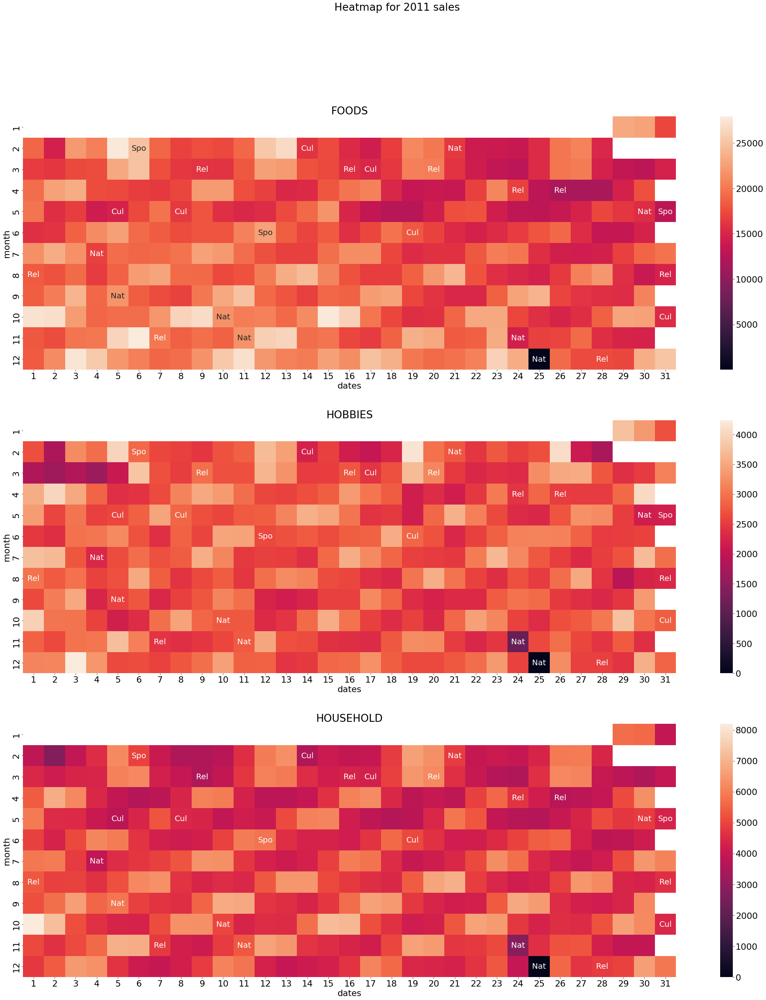

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

In [241]:
fig, ax=plt.subplots(3,1, figsize=(40,40))
plt.suptitle('Heatmap for 2011 sales')

grouped_data=cat_sales_data[pd.to_datetime(str(2011)+'-01-01'):pd.to_datetime(str(2011)+'-12-31')]
grouped_data['overall_dates']=grouped_data.index


grouped_data['is_holiday']=grouped_data['overall_dates'].apply(ho)
grouped_data.drop(['FOODS','HOBBIES','HOUSEHOLD'],axis=1, inplace=True)
grouped_data['dates']=grouped_data['overall_dates'].dt.day
grouped_data['month']=grouped_data['overall_dates'].dt.month
grouped_data.drop('overall_dates',axis=1, inplace=True)

grouped_data.columns=['values','dates','month']

d=pd.pivot(data=grouped_data,values='values',index='month',columns='dates').fillna(' ')

a=0
for c in categories:
    grouped_data_2=cat_sales_data[pd.to_datetime(str(2011)+'-01-01'):pd.to_datetime(str(2011)+'-12-31')][c]
    grouped_data_2=grouped_data_2.reset_index()
    grouped_data_2['dates']=grouped_data_2['date'].dt.day
    grouped_data_2['month']=grouped_data_2['date'].dt.month
    grouped_data_2.drop('date', axis=1, inplace=True)
    grouped_data_2.columns=['values','dates','month']
    plt.rcParams.update({'font.size': 22})
    plt.figure(figsize=(40,20))
    sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,annot=d, fmt='s',annot_kws={'size': 20} , ax=ax[a]).set(title=c)
    a+=1

***Plotting this plot only for the last 2 years***

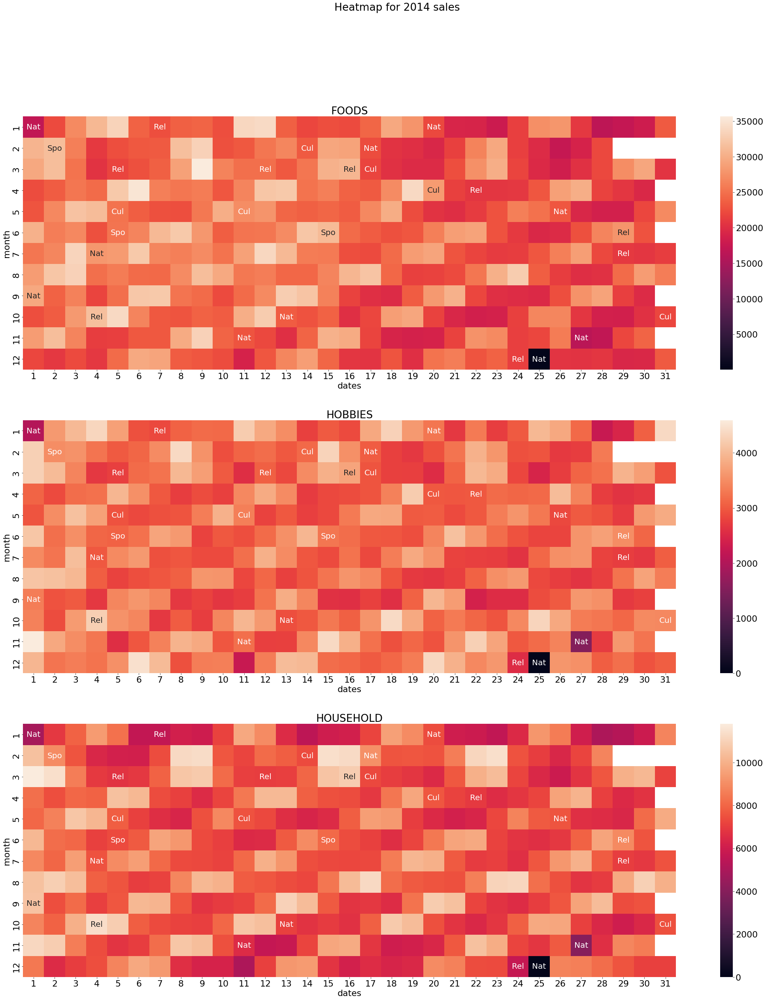

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

In [242]:
fig, ax=plt.subplots(3,1, figsize=(40,40))
plt.suptitle('Heatmap for 2014 sales')

grouped_data=cat_sales_data[pd.to_datetime(str(2014)+'-01-01'):pd.to_datetime(str(2014)+'-12-31')]
grouped_data['overall_dates']=grouped_data.index


grouped_data['is_holiday']=grouped_data['overall_dates'].apply(ho)
grouped_data.drop(['FOODS','HOBBIES','HOUSEHOLD'],axis=1, inplace=True)
grouped_data['dates']=grouped_data['overall_dates'].dt.day
grouped_data['month']=grouped_data['overall_dates'].dt.month
grouped_data.drop('overall_dates',axis=1, inplace=True)

grouped_data.columns=['values','dates','month']

d=pd.pivot(data=grouped_data,values='values',index='month',columns='dates').fillna(' ')

a=0
for c in categories:
    grouped_data_2=cat_sales_data[pd.to_datetime(str(2014)+'-01-01'):pd.to_datetime(str(2014)+'-12-31')][c]
    grouped_data_2=grouped_data_2.reset_index()
    grouped_data_2['dates']=grouped_data_2['date'].dt.day
    grouped_data_2['month']=grouped_data_2['date'].dt.month
    grouped_data_2.drop('date', axis=1, inplace=True)
    grouped_data_2.columns=['values','dates','month']
    plt.rcParams.update({'font.size': 22})
    plt.figure(figsize=(40,20))
    sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,annot=d, fmt='s',annot_kws={'size': 20} , ax=ax[a]).set(title=c)
    a+=1

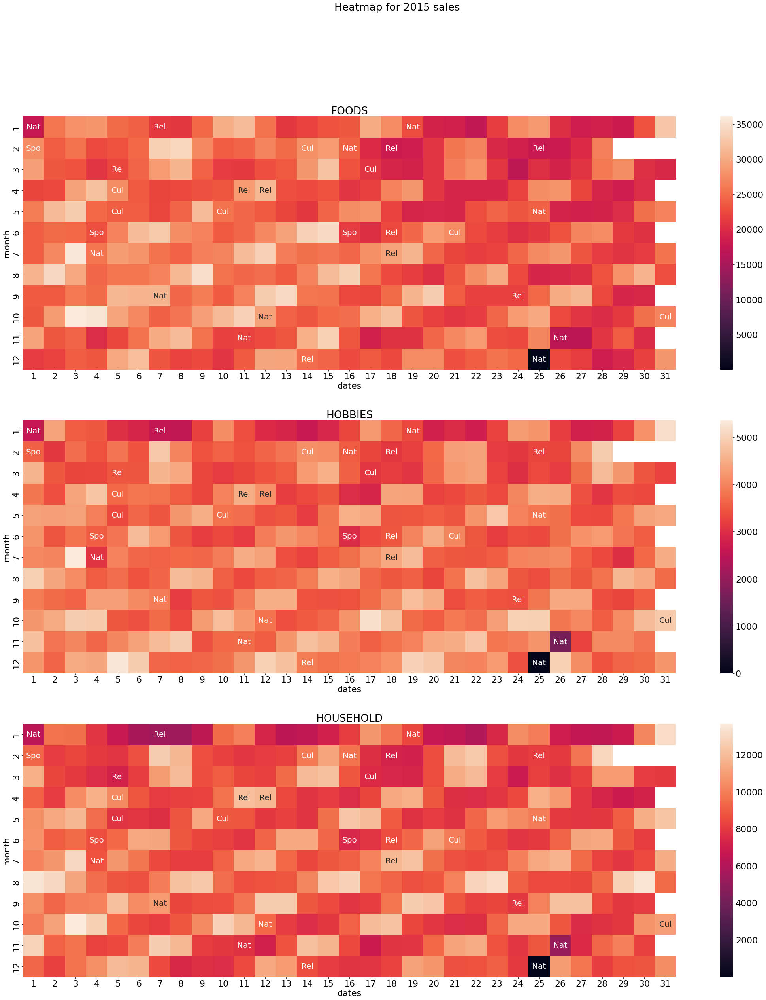

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

<Figure size 2880x1440 with 0 Axes>

In [243]:
fig, ax=plt.subplots(3,1, figsize=(40,40))
plt.suptitle('Heatmap for 2015 sales')

grouped_data=cat_sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')]
grouped_data['overall_dates']=grouped_data.index


grouped_data['is_holiday']=grouped_data['overall_dates'].apply(ho)
grouped_data.drop(['FOODS','HOBBIES','HOUSEHOLD'],axis=1, inplace=True)
grouped_data['dates']=grouped_data['overall_dates'].dt.day
grouped_data['month']=grouped_data['overall_dates'].dt.month
grouped_data.drop('overall_dates',axis=1, inplace=True)

grouped_data.columns=['values','dates','month']

d=pd.pivot(data=grouped_data,values='values',index='month',columns='dates').fillna(' ')

a=0
for c in categories:
    grouped_data_2=cat_sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')][c]
    grouped_data_2=grouped_data_2.reset_index()
    grouped_data_2['dates']=grouped_data_2['date'].dt.day
    grouped_data_2['month']=grouped_data_2['date'].dt.month
    grouped_data_2.drop('date', axis=1, inplace=True)
    grouped_data_2.columns=['values','dates','month']
    plt.rcParams.update({'font.size': 22})
    plt.figure(figsize=(40,20))
    sns.heatmap(pd.pivot_table(data=grouped_data_2,values='values',index='month',columns='dates'),square=True,annot=d, fmt='s',annot_kws={'size': 20} , ax=ax[a]).set(title=c)
    a+=1

***Plotting a line plot with highlights showing the events***

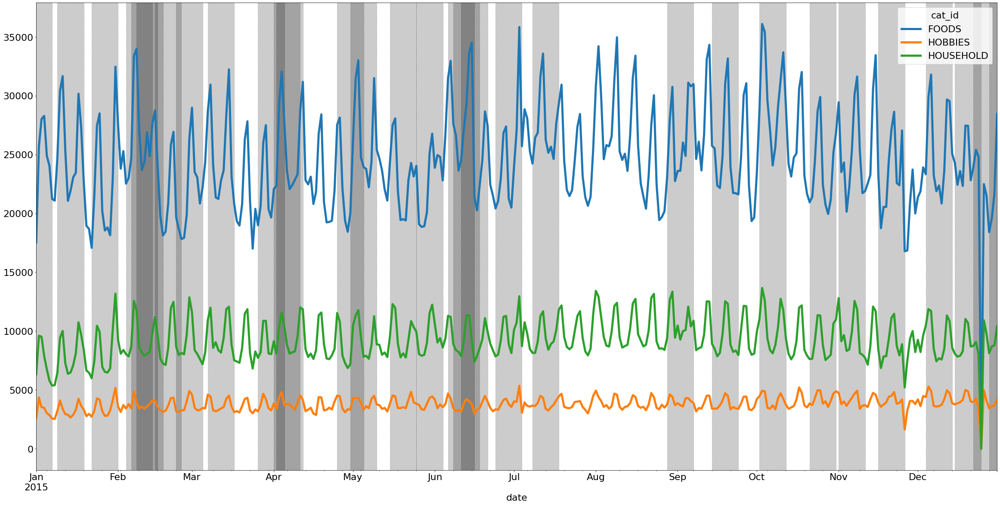

In [244]:
grouped_data=cat_sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')]
grouped_data.plot(figsize=(40,20), linewidth=5)

for dates in event_dates:
    plt.axvspan(dates,dates-pd.Timedelta(days=10), color='k', linestyle='--', alpha=0.2)

#### *There is no seasonality or increase seen in the plot,when noticing the sales numbers. Checking with folling mean.*

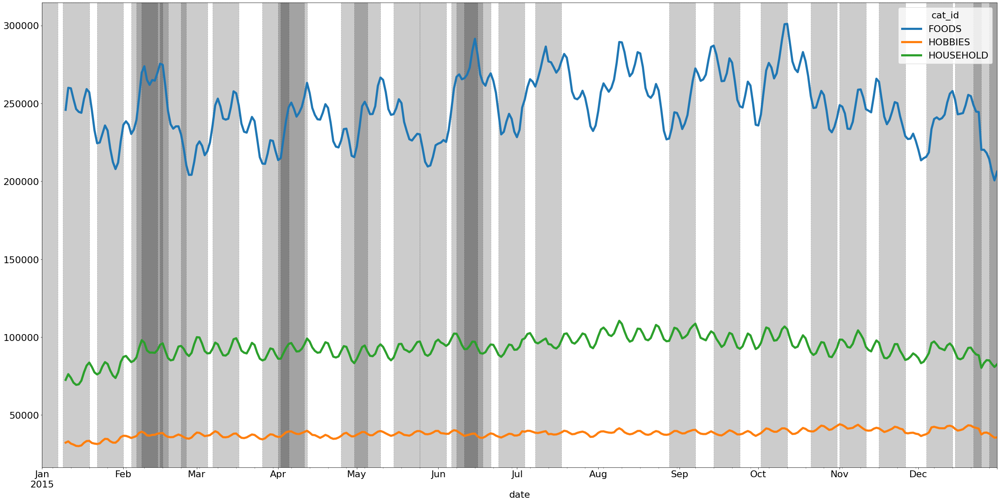

In [245]:
grouped_data=cat_sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')]
grouped_data.rolling(10).sum().plot(figsize=(40,20), linewidth=5)

for dates in event_dates:
    plt.axvspan(dates,dates-pd.Timedelta(days=10), color='k', linestyle='--', alpha=0.2)

#### The food, does not seem to be affected by the events. Checking only the other 2 categories.

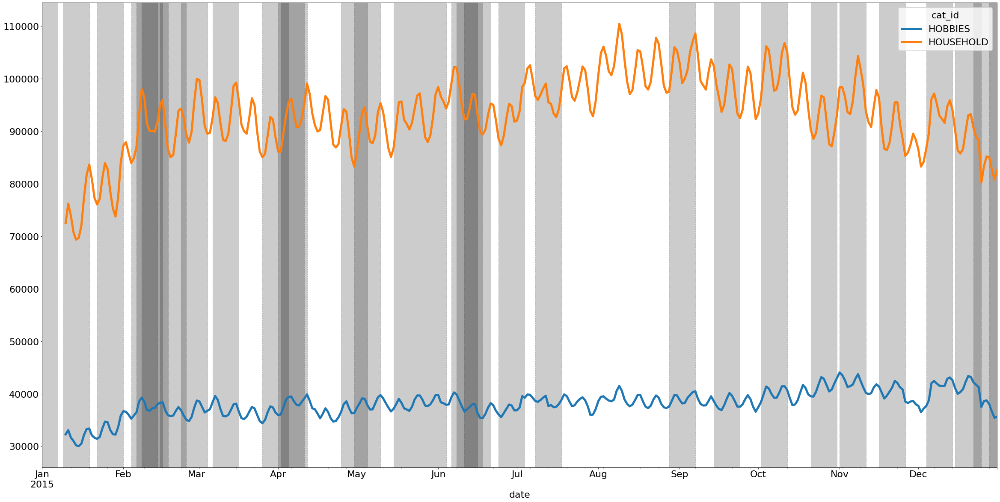

In [246]:
grouped_data=cat_sales_data[pd.to_datetime(str(2015)+'-01-01'):pd.to_datetime(str(2015)+'-12-31')][cat_sales_data.columns[1:]]
grouped_data.rolling(10).sum().plot(figsize=(40,20), linewidth=5)

for dates in event_dates:
    plt.axvspan(dates,dates-pd.Timedelta(days=10), color='k', linestyle='--', alpha=0.2)

### The hobbies show a seasonal trend related to events.

In [247]:
calendar[['snap_CA','snap_TX','snap_WI']].sum(axis=0)
#Equal number of snap days

snap_CA    650
snap_TX    650
snap_WI    650
dtype: int64

In [248]:
calendar[['snap_CA','snap_TX','snap_WI']]
calendar

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,is_event_day
date,,,,,,,,,,,,,,,
2011-01-29,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,0
2011-01-30,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0,0
2011-01-31,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0,0
2011-02-01,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0,0
2011-02-02,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-06-15,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1,0
2016-06-16,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0,0
2016-06-17,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0,0


In [249]:
sales_price
def category(x):
    i=x.split('_')
    cat='_'.join(i[:-1])
    return cat
sales_price['category']=sales_price['item_id'].apply(category)

In [250]:
week_month=dict(zip(calendar['wm_yr_wk'],calendar['month']))
week_yr=dict(zip(calendar['wm_yr_wk'],calendar['year']))

In [251]:
def get_month(x):
    i=week_month.get(x)
    return i
def get_year(x):
    i=week_yr.get(x)
    return i
sales_price['month']=sales_price['wm_yr_wk'].apply(get_month)
sales_price['year']=sales_price['wm_yr_wk'].apply(get_year)

**Checking what is the max & min price for each product category**

In [252]:
sales_price.groupby(['category','year'])['sell_price'].describe()

count      mean       std   min   25%   50%   75%     max
category    year                                                              
FOODS_1     2011   59783.0  3.308030  2.043642  0.49  1.97  2.50  3.97    9.34
            2012   84357.0  3.431549  2.079146  0.50  1.97  2.68  4.74    9.67
            2013  101511.0  3.341363  2.099361  0.25  1.88  2.48  4.74   12.98
            2014  109123.0  3.345991  2.096182  0.07  1.96  2.48  4.74   12.98
            2015  112280.0  3.407362  2.136456  0.25  1.98  2.68  4.81   11.84
            2016   56160.0  3.410547  2.125509  0.88  1.98  2.68  4.86   11.84
FOODS_2     2011   80919.0  3.774713  2.440580  0.58  2.24  2.88  4.78   13.74
            2012  116236.0  4.012373  2.547041  0.50  2.44  2.97  5.24   13.74
            2013  149488.0  4.078958  2.547202  0.33  2.47  2.98  5.34   12.97
            2014  174742.0  4.093877  2.583758  0.20  2.47  2.98  5.28   13.98
            2015  198440.0  4.187892  2.707830  0.20  2.48  2.98  5.00   13.98
            2016  103480.0  4.197748  2.709401  0.20  2.48  2.98  5.08   13.98
FOODS_3     2011  196491.0  2.756511  1.855476  0.01  1.76  2.48  3.50   19.48
            2012  268666.0  2.815669  1.801953  0.05  1.78  2.50  3.68   18.98
            2013  334567.0  2.816550  1.751228  0.02  1.88  2.50  3.48   18.98
            2014  396169.0  2.828943  1.683679  0.01  1.98  2.50  3.48   18.98
            2015  425430.0  2.895336  1.748529  0.05  1.98  2.50  3.50   18.73
            2016  213947.0  2.912416  1.768733  0.10  1.98  2.56  3.54   18.73
HOBBIES_1   2011   98001.0  5.268824  4.078744  0.30  1.97  4.22  7.88   17.78
            2012  148430.0  5.676711  4.478530  0.17  2.24  4.62  7.98   30.98
            2013  182154.0  6.155692  5.103816  0.01  2.38  4.88  8.67   30.98
            2014  207740.0  6.515869  5.502174  0.20  2.57  4.97  9.42   30.98
            2015  215852.0  6.625233  5.535662  0.25  2.50  4.97  9.88   30.98
            2016  108160.0  6.610084  5.518351  0.25  2.57  4.97  9.83   29.96
HOBBIES_2   2011   32669.0  2.851821  1.670374  0.20  1.97  2.58  3.97    7.47
            2012   45414.0  2.780207  1.771147  0.19  1.00  2.58  3.77    7.37
            2013   58452.0  2.752485  1.859147  0.07  0.97  2.77  3.88    9.97
            2014   71139.0  2.659516  1.943549  0.15  0.97  2.47  3.88    9.97
            2015   77154.0  2.592645  1.966988  0.05  0.97  2.47  3.48    9.97
            2016   38740.0  2.576713  1.968228  0.05  0.97  2.47  3.37    9.97
HOUSEHOLD_1 2011  110921.0  4.951706  3.311734  0.49  2.78  3.98  6.27   20.46
            2012  171194.0  4.972193  3.422846  0.49  2.84  3.98  5.97   17.97
            2013  213314.0  4.949344  3.502176  0.39  2.74  3.97  5.97   29.97
            2014  252437.0  5.078670  3.695240  0.01  2.78  3.97  6.42   29.97
            2015  274165.0  5.158455  3.781211  0.18  2.84  3.98  6.43   29.97
            2016  138266.0  5.176715  3.792752  0.50  2.86  3.98  6.48   29.97
HOUSEHOLD_2 2011  148540.0  6.012836  3.028299  0.78  3.97  5.72  6.97   28.00
            2012  190937.0  6.004193  3.171456  0.38  3.97  5.67  6.97   61.46
            2013  222122.0  5.843386  3.090220  0.74  3.97  5.62  6.97  107.32
            2014  252238.0  5.789187  3.019621  0.25  3.93  5.48  6.97   48.78
            2015  267393.0  5.773697  3.059581  0.78  3.88  5.47  6.97   45.32
            2016  133900.0  5.777827  3.080425  0.05  3.88  5.48  6.97   33.72

### Inferences:
- The Hobby has the highest variance.
- 

<AxesSubplot:title={'center':'Standard Deviation Price'}, xlabel=' '>

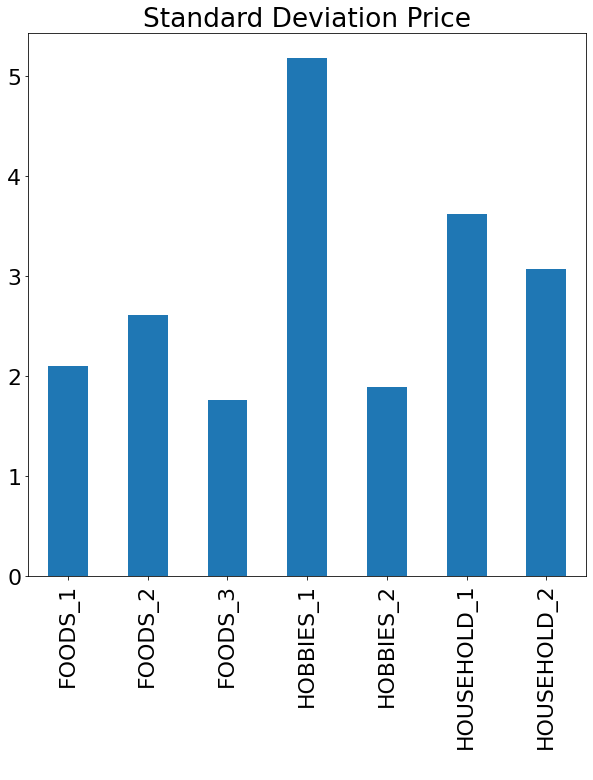

In [253]:
plt.title('Standard Deviation Price')

sales_price.groupby('category')['sell_price'].std().plot(kind='bar', figsize=(10,10), xlabel=' ')

<AxesSubplot:title={'center':'Mean Price'}, xlabel=' '>

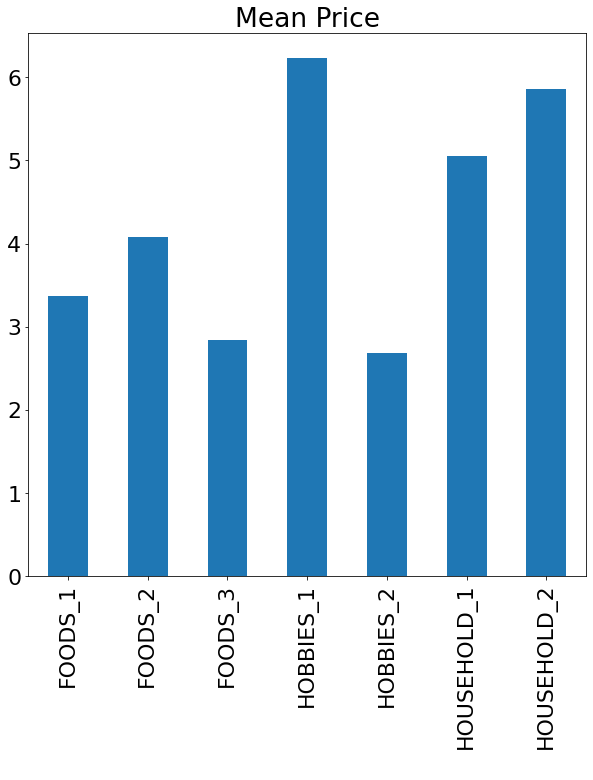

In [254]:
plt.title('Mean Price')
sales_price.groupby('category')['sell_price'].mean().plot(kind='bar', figsize=(10,10), xlabel=' ')

In [255]:
#https://www.kaggle.com/code/nxrprime/preprocessing-fe?scriptVersionId=31772037
#https://www.kaggle.com/code/tarunpaparaju/m5-competition-eda-models/notebook
#https://www.kaggle.com/competitions/m5-forecasting-accuracy/discussion/149251
#EDA https://www.kaggle.com/competitions/m5-forecasting-accuracy/discussion/148900
# 2nd place solution: https://www.kaggle.com/competitions/m5-forecasting-accuracy/discussion/164599

In [257]:
#Additional features as mentioned in the following blogs:
# https://medium.com/data-science-at-microsoft/introduction-to-feature-engineering-for-time-series-forecasting-620aa55fcab0
#https://towardsdatascience.com/top-4-time-series-feature-engineering-lessons-from-kaggle-ca2d4c9cbbe7
# https://www.analyticsvidhya.com/blog/2019/12/6-powerful-feature-engineering-techniques-time-series/
# https://machinelearningmastery.com/basic-feature-engineering-time-series-data-python/